In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#%cd /content/drive/MyDrive/TP_IMA204_activecontours_2023-24_FINAL/TP_IMA204_activecontours_2023-24_FINAL

/content/drive/MyDrive/TP_IMA204_activecontours_2023-24_FINAL/TP_IMA204_activecontours_2023-24_FINAL


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib import animation, rc

from skimage.color import rgb2gray
from skimage import data
from skimage.filters import gaussian
from skimage.segmentation import active_contour # For active_contour function

# For active_contour function
from skimage.segmentation import chan_vese, morphological_chan_vese, checkerboard_level_set,morphological_geodesic_active_contour

# For some image filtering
from skimage.morphology import white_tophat, black_tophat, disk

import skimage.io

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"



In [ ]:
def edge_map(img,sigma):
    blur = skimage.filters.gaussian(img,sigma)
    return skimage.filters.sobel(blur)

def edge_map2(img,sigma):
    blur = skimage.filters.gaussian(img,sigma)
    return skimage.filters.scharr(blur)

def subtract_background(image, radius=5, light_bg=False):
        str_el = disk(radius)
        if light_bg:
            return black_tophat(image, str_el)
        else:
            return white_tophat(image, str_el)


def define_initial_circle(R0,r0,c0,Nber_pts=400):
    # Define initial contour shape
    s      = np.linspace(0, 2*np.pi, Nber_pts)
    Radius = R0
    r      = r0 + Radius*np.sin(s)
    c      = c0 + Radius*np.cos(s) #col
    init   = np.array([r, c]).T
    return init


## Create slides for animation
def animate_cv(image, segs, interval=1000):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(image, cmap='gray');
    im = ax.imshow(segs[0], alpha=0.5, cmap='inferno');
    ax.axis('off')

    def init():
        im.set_data(segs[0])
        return [im]

    def animate(i):
        im.set_array(segs[i])
        return [im]

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=len(segs), interval=1000, blit=True);
    return anim


def animate_snake(image, segs, interval=500):
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(image, cmap='gray');
    #    im = ax.imshow(segs[0], alpha=0.5, cmap='inferno');
    #ax.plot(segs[0][:, 1], segs[0][:, 0], '--r', lw=3)
    ax.axis('off')
    line, = ax.plot([], [], '-r', lw=2)

    def init():
        line.set_data(segs[0,:,1],segs[0,:,0])
        return [line,]

    def animate(i):
        line.set_data(segs[i,:,1],segs[i,:,0])
        return [line,]

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames=len(segs), interval=1000, blit=True);
    return anim



###########################
def store_evolution_in(lst):
    """Returns a callback function to store the evolution of the level sets in
    the given list.
    """

    def _store(x):
        lst.append(np.copy(x))

    return _store

# Read images

This cell reads a series of images that you can then use in various tests. <br>
Note that some images are provided with ground-truth masks of structures of interest:<br>
1. OCT_myocardium/case272.tif [one image]
2. images_blood_cells/000016.png [several images available]


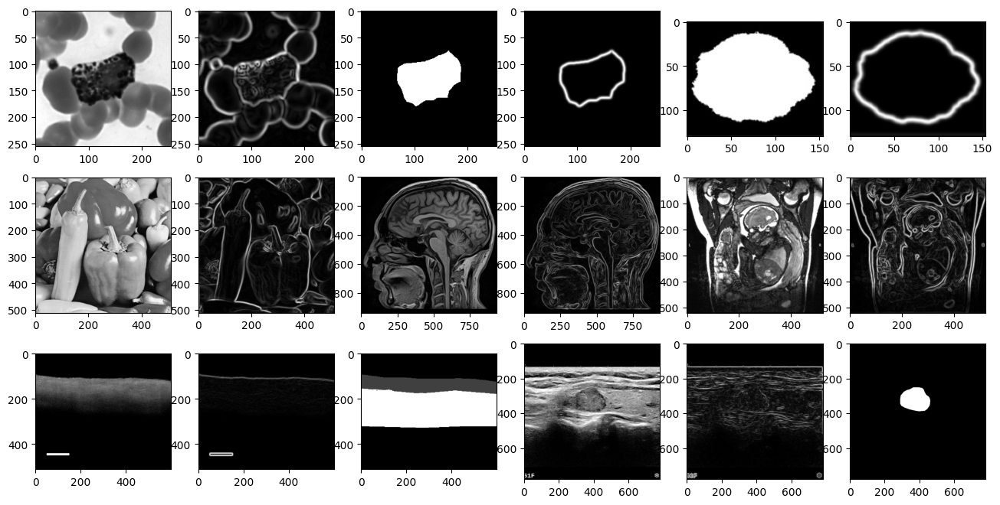

In [ ]:
# import warnings
# warnings.filterwarnings( "ignore", module = "matplotlib\..*" )

img_star          = skimage.io.imread('./images_misc/smooth_star.png', as_gray = True)
img_star_noisy    = skimage.io.imread('./images_misc/smooth_star_noisy.png', as_gray = True)

img_hela    = skimage.io.imread('./images_misc/hela_big_gt.png', as_gray = False)

edge_hela   = edge_map(img_hela, sigma=2)
img_hela = np.squeeze(img_hela)

img_pepper  = skimage.io.imread('./images_misc/peppers_gt.png', as_gray = False)
img_pepper = np.squeeze(img_pepper)

edge_pepper = edge_map(img_pepper, sigma=2)
img_pepper  = img_pepper.astype('float64')




img_MRIb  = skimage.io.imread('./images_misc/MRI_brain_sag.png', as_gray = True)
edge_MRIb = edge_map(img_MRIb, sigma=2)
img_MRIf  = skimage.io.imread('./images_misc/MRI_fetus.png', as_gray = True)
edge_MRIf = edge_map(img_MRIf, sigma=2)


img_cell  = skimage.io.imread('./images_blood_cells/000016.png', as_gray = True)
edge_cell = edge_map(img_cell, sigma=2)
#skimage.io.imshow(img_cell)

img_mask = skimage.io.imread('./masks_blood_cells/000016.png', as_gray = True)
edge_mask = edge_map(img_mask, sigma=2)
img_mask2 = skimage.io.imread('./images_misc/binary_shape_2024.png', as_gray = True)
edge_mask2 = edge_map(img_mask2, sigma=2)
# skimage.io.imshow(img_mask)

img_OCT  = skimage.io.imread('./OCT_myocardium/case272.tif', as_gray = True)
edge_OCT = edge_map(img_OCT, sigma=2)
labels_OCT = skimage.io.imread('./OCT_myocardium/case272_label.tiff', as_gray = True)


img_nodule = skimage.io.imread('./thyroid_nodule/1074.png', as_gray = True)
edge_nodule = edge_map(img_nodule, sigma=2)
labels_nodule = skimage.io.imread('./thyroid_nodule/1074_mask.png', as_gray = True)


fig, axes = plt.subplots(3,6, figsize=(16, 8))
ax = axes.ravel()
ax[0].imshow(img_cell, cmap=plt.cm.gray);
ax[1].imshow(edge_cell, cmap=plt.cm.gray);
ax[2].imshow(img_mask, cmap=plt.cm.gray);
ax[3].imshow(edge_mask, cmap=plt.cm.gray);
ax[4].imshow(img_mask2, cmap=plt.cm.gray);
ax[5].imshow(edge_mask2, cmap=plt.cm.gray);

ax[6].imshow(img_pepper, cmap=plt.cm.gray);
ax[7].imshow(edge_pepper, cmap=plt.cm.gray);
ax[8].imshow(img_MRIb, cmap=plt.cm.gray);
ax[9].imshow(edge_MRIb, cmap=plt.cm.gray);
ax[10].imshow(img_MRIf, cmap=plt.cm.gray);
ax[11].imshow(edge_MRIf, cmap=plt.cm.gray);
ax[12].imshow(img_OCT, cmap=plt.cm.gray);
ax[13].imshow(edge_OCT, cmap=plt.cm.gray);
ax[14].imshow(labels_OCT, cmap=plt.cm.gray);
ax[15].imshow(img_nodule, cmap=plt.cm.gray);
ax[16].imshow(edge_nodule, cmap=plt.cm.gray);
ax[17].imshow(labels_nodule, cmap=plt.cm.gray);

# Image properties:
## Range of values and data type matter ...


Some routines won't work if your image type is int8 or uint8...
Here is how to check your image data type

And regularly check your image content in terms of:
* intensities range of values
* distributions of intensities via its histogram


float64
0.04579333333333333
255.0


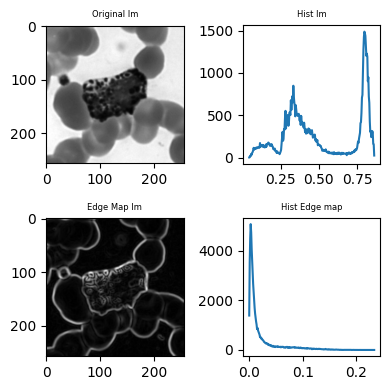

In [ ]:

img_test  = img_cell
Sigma_val = 1
edge_test = edge_map(img_test, sigma=Sigma_val)


## Print some basic image properties
print(img_test.dtype)
print(np.min(img_test))
print(np.max(img_pepper))


## Show Hist
hist_test, bins_test             = np.histogram(img_test.flatten(), bins=256)
hist_edge_test, bins_edges_test  = np.histogram(edge_test.flatten(), bins=256)

fig, axes = plt.subplots(2,2, figsize=(4, 4))
ax        = axes.ravel()
ax[0].imshow(img_test, cmap=plt.cm.gray);
ax[0].set_title("Original Im", fontsize=6);
ax[1].plot(bins_test[0:-1],hist_test);
ax[1].set_title("Hist Im", fontsize=6);
ax[2].imshow(edge_test, cmap=plt.cm.gray);
ax[2].set_title("Edge Map Im", fontsize=6);
ax[3].plot(bins_edges_test[0:-1],hist_edge_test);
ax[3].set_title("Hist Edge map", fontsize=6);
fig.tight_layout()
plt.show();



# Edge maps
Deformable models rely on edge maps. Most routines have their own strategy coded to compute the edge map.

* Edge maps usually involve smoothing of the image, to be robust to noise. Make sure you understand how this is controlled in the routine you use.
* Edge maps usually show pixels with high gradient magnitudes in white (high values)
* Most deformable model routines can be fed directly with an Edge Map rather than the original image as its input
* Some routine expect to be fed with an inverse edge map where high gradient locations have small values, to stop the contour via a velocity set to ~zero.

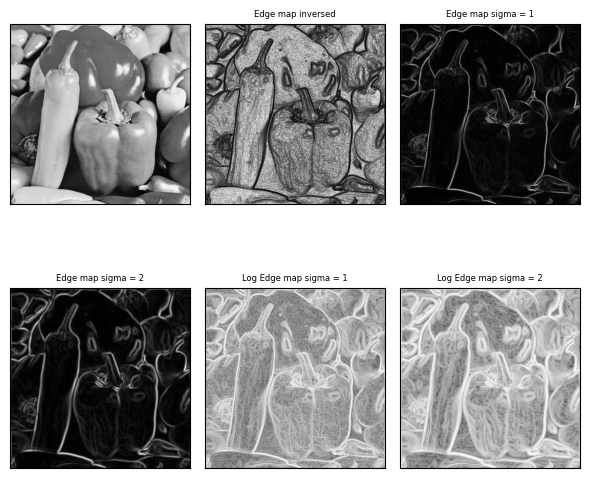

In [ ]:

img_to_test = img_pepper

# Classic Edge map with Gaussian smoothing controled by sigma
edge_test1         = edge_map(img_to_test, sigma=1)
edge_test1_l       = np.log2(edge_test1)
edge_test2         = edge_map(img_to_test, sigma=2)
edge_test2_l       = np.log2(edge_test2)

# Inversed Edge map
# Returns Edge map = 1.0 / np.sqrt(1.0 + alpha * gradnorm)
edge_inv_test  = skimage.segmentation.inverse_gaussian_gradient(img_to_test, alpha=1.0, sigma=1.0)


fig, axes = plt.subplots(2,3, figsize=(6, 6))
ax = axes.ravel()

ax[0].imshow(img_to_test, cmap=plt.cm.gray);
ax[1].imshow(edge_inv_test, cmap=plt.cm.gray);
ax[1].set_title("Edge map inversed", fontsize=6);
ax[2].imshow(edge_test1, cmap=plt.cm.gray);
ax[2].set_title("Edge map sigma = 1", fontsize=6);
ax[3].imshow(edge_test2, cmap=plt.cm.gray);
ax[3].set_title("Edge map sigma = 2", fontsize=6);
ax[4].imshow(edge_test1_l, cmap=plt.cm.gray);
ax[4].set_title("Log Edge map sigma = 1", fontsize=6);
ax[5].imshow(edge_test2_l, cmap=plt.cm.gray);
ax[5].set_title("Log Edge map sigma = 2", fontsize=6);

for i in range(0,6):
    ax[i].set_xticks([]), ax[i].set_yticks([]);

fig.tight_layout()
plt.show();

# Test some image manipulations

Let you test some image transformations based on morphological operators and histogram manipulation.
When transforming image contrast, it is always interesting to look at the differences between the original image and the transformed version.

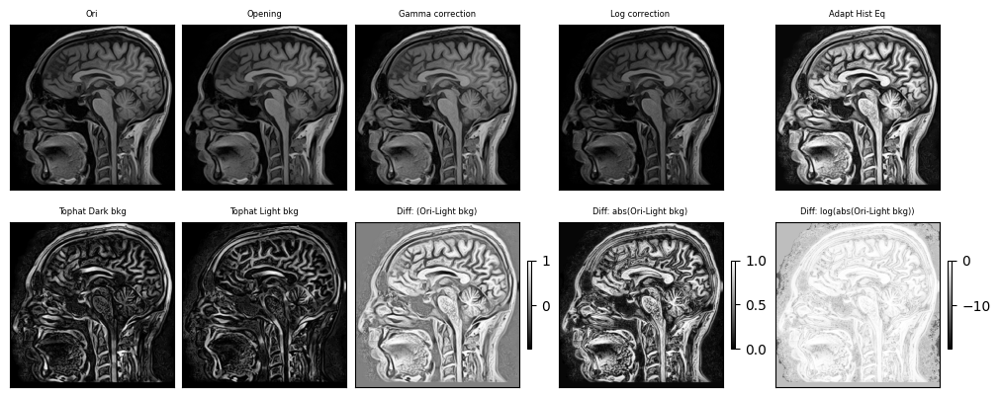

In [ ]:
img_ori_to_test = img_MRIb
img_to_test     = img_ori_to_test
epsilon         = 0.000001 #to prevent log on 0
img_eps         = np.full_like(img_to_test, epsilon)
PRE_ENHANCE     = 1
OPTION_ENHANCE  = 4 # can be 0 (nothing) OR 1,2,3,4 for different enchancement options

# Run all  OPTION_ENHANCE for display here
gamma_corrected       = skimage.exposure.adjust_gamma(img_to_test, 0.8)
logarithmic_corrected = skimage.exposure.adjust_log(img_to_test, gain= 1,inv=True)
img_open              = skimage.morphology.diameter_opening(img_to_test, 40, connectivity=2)
img_adapteq           = skimage.exposure.equalize_adapthist(img_to_test, clip_limit=0.03)

# PRE ENHANCEMENT OPTIONS:
if PRE_ENHANCE==1:
    if OPTION_ENHANCE==1:
        # Gamma
        img_to_test     = gamma_corrected
    elif OPTION_ENHANCE==2:
        # Logarithmic (O = gain*log(1 + I)) or if Inv (O = gain*(2**I - 1))
        img_to_test           = logarithmic_corrected
    elif OPTION_ENHANCE==3:
        # Morpho Opening
        img_to_test           = img_open
    elif OPTION_ENHANCE==4:
        # Contrast Limited Adaptive Histogram Equalization (CLAHE).
        img_to_test           = img_adapteq

# Enhance details either dark around light background of vice versa with the Top-Hat transform
Radius_val = 15
img_test1  = subtract_background(img_to_test, radius=Radius_val, light_bg=False)
img_test2  = subtract_background(img_to_test, radius=Radius_val, light_bg=True)

# SHOW OUTPUTS
fig, axes = plt.subplots(2,5, figsize=(10, 4),constrained_layout=True)
ax        = axes.ravel()
Shrink_factor_colormap = 0.5
ax[0].imshow(img_ori_to_test, cmap=plt.cm.gray);
ax[0].set_title("Ori", fontsize=6);

ax[1].imshow(img_open, cmap=plt.cm.gray);
ax[1].set_title("Opening", fontsize=6);
ax[2].imshow(gamma_corrected, cmap=plt.cm.gray);
ax[2].set_title("Gamma correction", fontsize=6);
ax[3].imshow(logarithmic_corrected, cmap=plt.cm.gray);
ax[3].set_title("Log correction", fontsize=6);
ax[4].imshow(img_adapteq, cmap=plt.cm.gray);
ax[4].set_title("Adapt Hist Eq", fontsize=6);

ax[5].imshow(img_test1, cmap=plt.cm.gray);
ax[5].set_title("Tophat Dark bkg", fontsize=6);
ax[6].imshow(img_test2, cmap=plt.cm.gray);
ax[6].set_title("Tophat Light bkg", fontsize=6);

tmp_show = ax[7].imshow(img_to_test-img_test2, cmap=plt.cm.gray);
ax[7].set_title("Diff: (Ori-Light bkg)", fontsize=6);
plt.colorbar(tmp_show,ax=ax[7], shrink=Shrink_factor_colormap, location='right')

tmp_show = ax[8].imshow(abs(img_to_test-img_test2), cmap=plt.cm.gray);
ax[8].set_title("Diff: abs(Ori-Light bkg)", fontsize=6);
plt.colorbar(tmp_show,ax=ax[8], shrink=Shrink_factor_colormap, location='right')

tmp_show = ax[9].imshow(np.log2(abs(img_to_test-img_test2+img_eps)), cmap=plt.cm.gray);
ax[9].set_title("Diff: log(abs(Ori-Light bkg))", fontsize=6);
plt.colorbar(tmp_show,ax=ax[9], shrink=Shrink_factor_colormap, location='right')

for i in range(0,10):
    ax[i].set_xticks([]), ax[i].set_yticks([]);

#fig.tight_layout() # not compatible with option constrained_layout=True in plt.subplots needed to display the colorbar
plt.show();


# Seg #1:
### Snake on a binary shape

Based on the routine **active_contour** from skimage. <br>
Default **parameter values** are: <br>
* alpha=0.01  (Snake length shape parameter. Higher values makes snake contract faster.)
* beta=0.1    (Snake smoothness shape parameter. Higher values makes snake smoother.)
* gamma=0.01  (Explicit time stepping parameter - Equivalent to the viscosity of the environment)
* max_px_move=1.0
<br>

There are two **other parameters** that define the final image information used to define external forces used to define regions.img = w_line x img + w_edge x edge: <br>
*   w_line_val= 0 (default) | =1 if want to input_edge map directly. Use negative values to attract toward dark
*   w_edge_val= 1 (default)  | = 0 if do not want to use internal edge map. Use negative values to repel snake from edges


## TODO:
1. Run the cell for **img_to_seg=img_mask** and **img_to_seg=img_mask2** with the sets of parameter values provided. 1st set uses values by default, 2nd-3rd sets use custom values to help improve the smoothness of the final contour. <br>
    1. Comment on defaults seen on the obtained initial segmentations. <br>
    1. Explain why you think increasing the gamma_val has better helped smooth the final contour.  <br>

2. Test now by using a small initial circle inside the white shape. What is happening and what additional force seen in the class could help fixing this issue?

3. Now run the segmentation on the **img_to_seg=img_star** or **img_to_seg=img_star_noisy**. Try the same parameter values adjustments as before to get a smoother final contour. Comment on the issues observed with the two options.
4. BONUS: there is a way to obtain a "perfect" segmentation for the star shape. Propose one solution which might involve many more iterations, once you have checked with few iterations that behavior is stable.


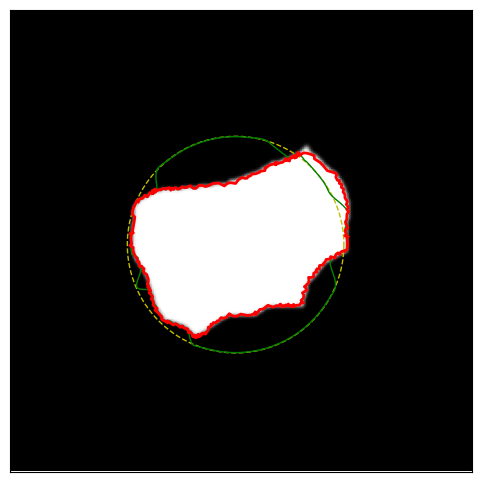

In [ ]:
# 1ST image
img_to_seg=img_mask; r0 = 130; c0=125; R0 = 60
#img_to_seg=img_mask2; r0 = 75; c0=65; R0 = 60

alpha_val  = 0.01 ; beta_val = 0.1 ;gamma_val = 0.01; convergence_val = 1e-4;Niter_snake = 800;
#alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.1; convergence_val = 1e-4; Niter_snake = 800;
#alpha_val  = 0.01 ; beta_val = 1; gamma_val = 0.01; convergence_val = 1e-4; Niter_snake = 800;

# 2ND image
#img_to_seg = img_star ; r0 = 64; c0=64; R0 = 50
#img_to_seg = img_star_noisy ; r0 = 64; c0=64; R0 = 50
#alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.01; convergence_val = 1e-4; Niter_snake = 800;


# Initialise contour
init = define_initial_circle(R0,r0,c0)

# Pre-smooth the image
Niter_smooth    = 1
img_to_seg      = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Run active contour
snake10 = active_contour(img_to_seg,
                       init, max_num_iter=10, convergence=convergence_val,
                         alpha=alpha_val, beta=beta_val, gamma=gamma_val)
snake_max = active_contour(img_to_seg,
                       init, max_num_iter=Niter_snake, convergence=convergence_val,
                           alpha=alpha_val, beta=beta_val, gamma=gamma_val)

# Display results
fig, ax = plt.subplots(figsize=(6, 6));
ax.imshow(img_to_seg, cmap=plt.cm.gray);
ax.plot(init[:, 1], init[:, 0], '--y', lw=1);
ax.plot(snake10[:, 1], snake10[:, 0], '-g', lw=1);
ax.plot(snake_max[:, 1], snake_max[:, 0], '-r', lw=2);
ax.set_xticks([]), ax.set_yticks([]);
ax.axis([0, img_to_seg.shape[1], img_to_seg.shape[0], 0]);

plt.show();

### Answer:

1)

In [ ]:
convergence_val = 1e-4;
# Initialise contour
def segment_img(img_to_seg = img_mask, r0 = 130, c0=125, R0 = 60, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01 , num_iter = 10, Niter_snake = 800, Niter_smooth = 1):
  init = define_initial_circle(R0,r0,c0)

  # Pre-smooth the image
  img_to_seg      = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

  # Run active contour
  snake = active_contour(img_to_seg,
                        init, max_num_iter= num_iter, convergence=convergence_val,
                          alpha=alpha_val, beta=beta_val, gamma=gamma_val)
  snake_max = active_contour(img_to_seg,
                        init, max_num_iter=Niter_snake, convergence=convergence_val,
                            alpha=alpha_val, beta=beta_val, gamma=gamma_val)

  # Display results
  fig, ax = plt.subplots(figsize=(6, 6));
  ax.imshow(img_to_seg, cmap=plt.cm.gray);
  ax.plot(init[:, 1], init[:, 0], '--y', lw=1);
  ax.plot(snake[:, 1], snake[:, 0], '-b', lw=1.5);
  ax.plot(snake_max[:, 1], snake_max[:, 0], '-r', lw=2);
  ax.set_xticks([]), ax.set_yticks([]);
  ax.axis([0, img_to_seg.shape[1], img_to_seg.shape[0], 0]);
  ax.set_title(f"alpha_val  = {alpha_val}, beta_val = {beta_val}, gamma_val = {gamma_val}")

  plt.show();

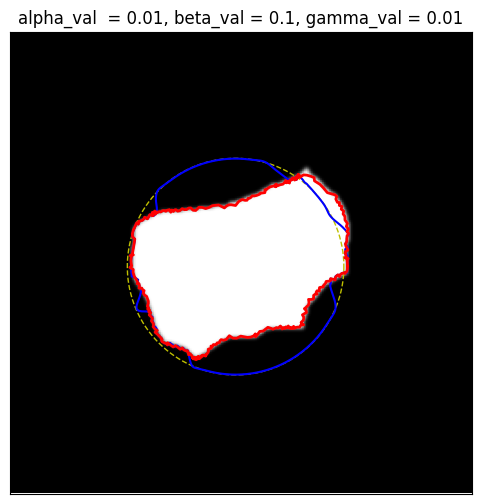

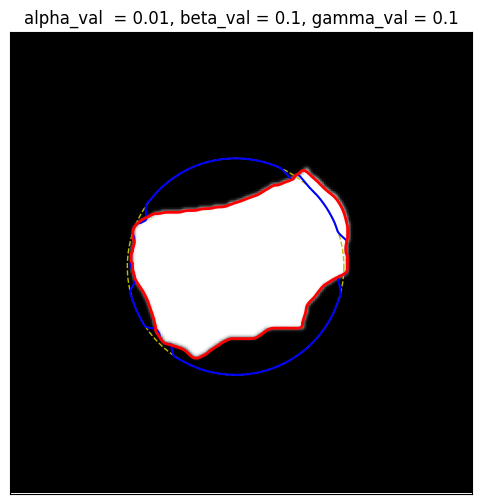

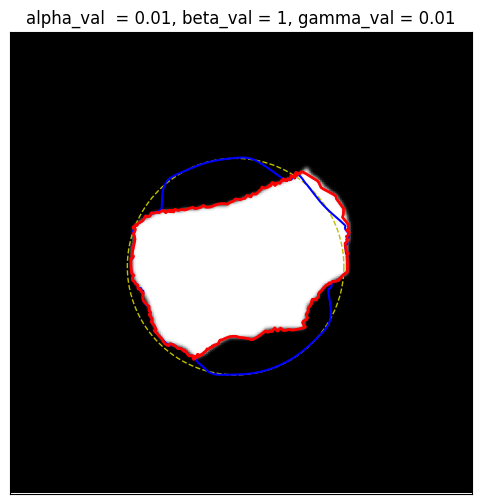

In [ ]:
# 1ST image img_to_seg=img_mask; r0 = 130; c0=125; R0 = 60
# 1st set default
segment_img(img_to_seg = img_mask, r0 = 130, c0=125, R0 = 60, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01)
# 2nd set
segment_img(img_to_seg = img_mask, r0 = 130, c0=125, R0 = 60, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.1)
# 3rd set
segment_img(img_to_seg = img_mask, r0 = 130, c0=125, R0 = 60, alpha_val  = 0.01, beta_val = 1, gamma_val = 0.01)

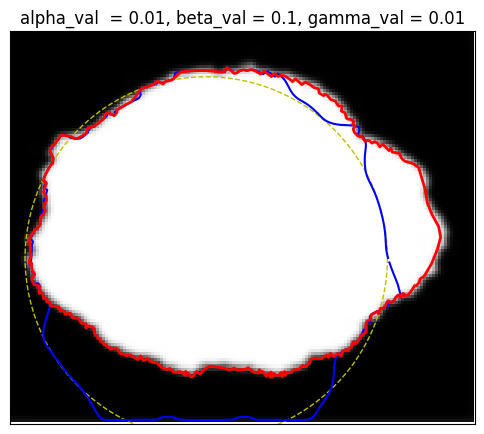

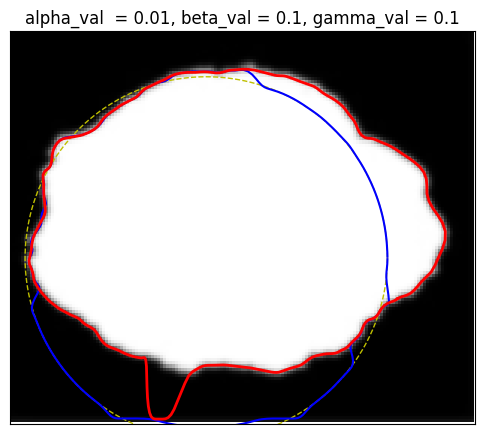

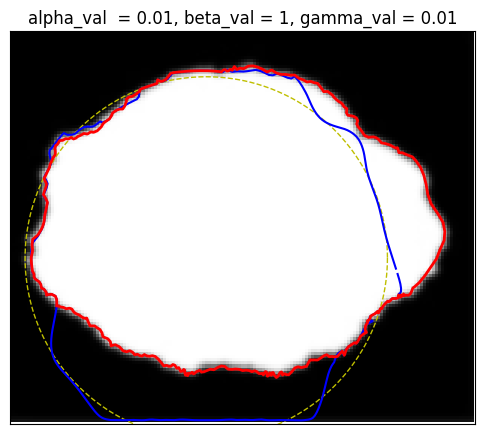

In [ ]:
# 1ST img_to_seg=img_mask2; r0 = 75; c0=65; R0 = 60
# 1st set default
segment_img(img_to_seg=img_mask2, r0 = 75, c0=65, R0 = 60, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01)
# 2nd set
segment_img(img_to_seg=img_mask2, r0 = 75, c0=65, R0 = 60, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.1)
# 3rd set
segment_img(img_to_seg=img_mask2, r0 = 75, c0=65, R0 = 60, alpha_val  = 0.01, beta_val = 1, gamma_val = 0.01)

1.   The default settings resulted in initial contours that were not very smooth, presenting irregular shapes and high curvatures.
2. The gamma parameter in the snake algorithm serves as an explicit time-stepping parameter, influencing the snake's rate of evolution during segmentation. A higher gamma introduces damping, slowing down the snake's movement to prevent abrupt changes in the contour, promoting stability. This increased damping regularizes contour evolution, preventing quick responses to image variations and resulting in a smoother contour. Moreover, higher gamma minimizes oscillations in the snake's movement, contributing to a more stable and accurate contour.
2)


2)

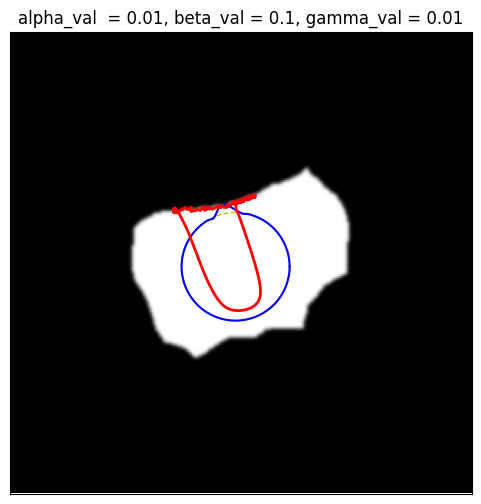

In [ ]:
segment_img(img_to_seg = img_mask, r0 = 130, c0=125, R0 = 30, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01)

When using a small initial circle inside the white shape, the snake may face difficulty expanding to cover the entire region due to weak internal forces. The internal forces such as edge attraction and length regularization might not provide sufficient influence to reach and cover the entire shape, resulting in incomplete segmentation.

To address this issue, one additional force that could help is the balloon force. The balloon force pushes the snake outward or inward, providing additional control over the expansion or contraction of the snake. In this specific case, introducing a slight outward balloon force would assist the snake in expanding from the small initial circle to cover the entire white shape.

3)

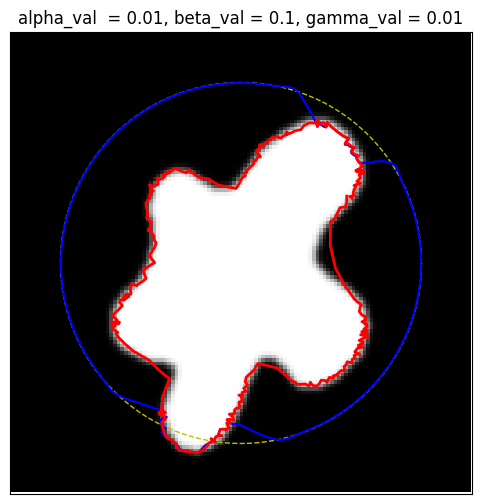

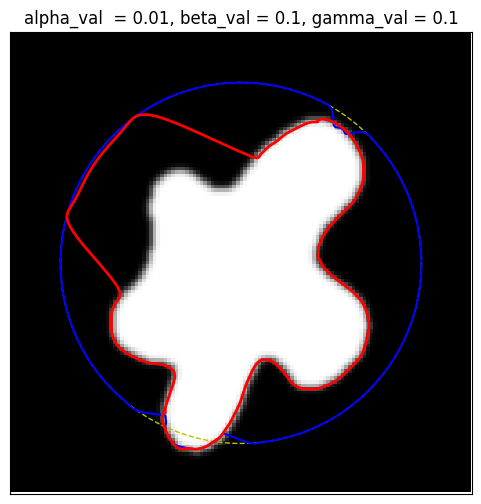

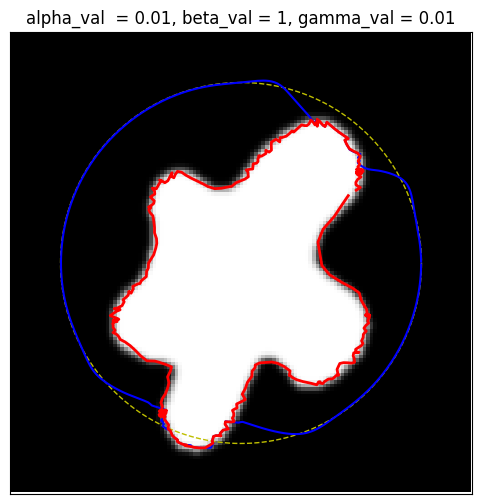

In [ ]:
# 2ND image
#img_to_seg = img_star ; r0 = 64; c0=64; R0 = 50
# 1st set default
segment_img(img_to_seg = img_star, r0 = 64, c0=64, R0 = 50, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01)
# 2nd set
segment_img(img_to_seg = img_star, r0 = 64, c0=64, R0 = 50, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.1)
# 3rd set
segment_img(img_to_seg = img_star, r0 = 64, c0=64, R0 = 50, alpha_val  = 0.01, beta_val = 1, gamma_val = 0.01)

The intricate and complex features of the star shape pose challenges for the snake algorithm in maintaining a smooth contour.

Default Parameters:
- Observation: Lack of convergence and high curvature in the initial contours.
- Comment: The default settings might not be suitable for capturing the intricate details of the star shape, leading to difficulties in achieving a smooth contour.

Increasing Gamma:
- Observation: High lack of convergence with augmented gamma.
- Comment: Augmenting gamma might introduce too much damping or resistance, hindering the convergence of the snake algorithm. This can result in an unsatisfactory segmentation.

Increasing Beta:
- Observation: Discontinuity of the contour and high curvature with augmented beta.
- Comment: Augmenting beta, the smoothness parameter, may lead to a contour that is too rigid, causing discontinuities and high curvature.

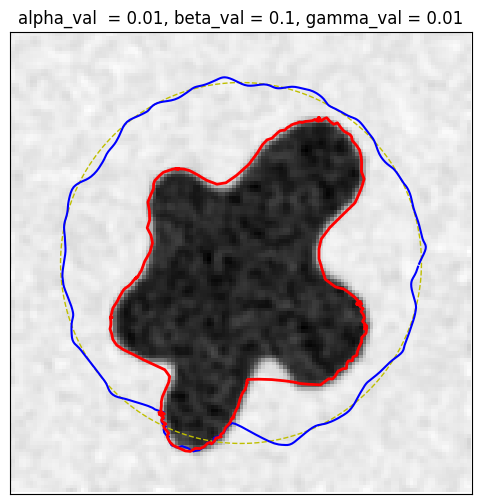

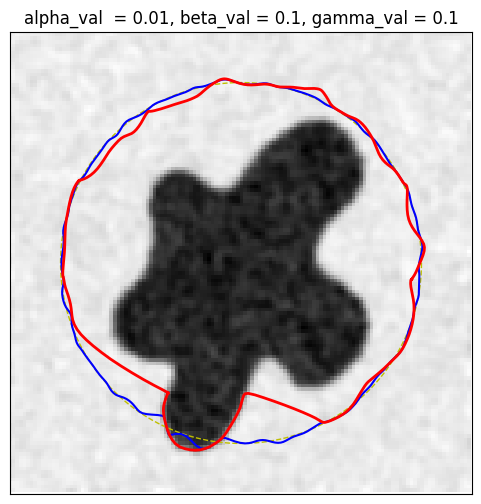

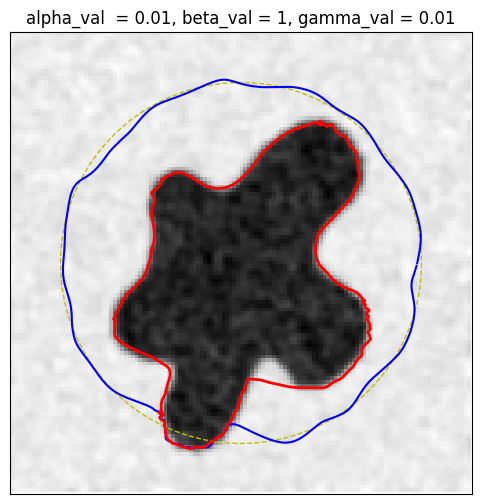

In [ ]:
# 2ND image
#img_to_seg = img_star_noisy ; r0 = 64; c0=64; R0 = 50
# 1st set default
segment_img(img_to_seg = img_star_noisy, r0 = 64, c0=64, R0 = 50, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01)
# 2nd set
segment_img(img_to_seg = img_star_noisy, r0 = 64, c0=64, R0 = 50, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.1)
# 3rd set
segment_img(img_to_seg = img_star_noisy, r0 = 64, c0=64, R0 = 50, alpha_val  = 0.01, beta_val = 1, gamma_val = 0.01)

Noisy or textured regions in img_star_noisy interfere with the contour evolution, resulting in an uneven or jagged final contour. The noise in the image causes the snake to respond to fine-scale variations, leading to even more irregularities in the segmentation.

4)

In [ ]:
def Bonus_1(img = img_star):
  R0, r0, c0, Nber_pts = 50, 64, 64, 400
  init_contour = define_initial_circle(R0, r0, c0, Nber_pts)

  # Gradually increase iterations
  max_iterations = 1000
  convergence_val = 1e-4

  for num_iter in range(100, max_iterations + 1, 100):
      # Pre-smooth the image
      img_smoothed = gaussian(img, sigma=2, preserve_range=False)

      # Run active contour with increased iterations
      snake_result = active_contour(img_smoothed,
                                    init_contour,
                                    max_num_iter=num_iter,
                                    convergence=convergence_val,
                                    alpha=0.01,
                                    beta=1,
                                    gamma=0.05)

      # Display results after each iteration increase
      plt.figure(figsize=(6, 6))
      plt.imshow(img_smoothed, cmap=plt.cm.gray)
      plt.plot(init_contour[:, 1], init_contour[:, 0], '--y', lw=1)
      plt.plot(snake_result[:, 1], snake_result[:, 0], '-r', lw=2)
      plt.title(f'Segmentation after {num_iter} iterations')
      plt.xticks([]), plt.yticks([])
      plt.axis([0, img_star.shape[1], img_star.shape[0], 0])
      plt.show()

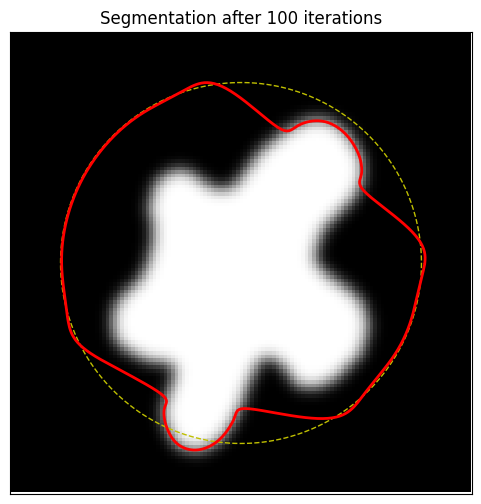

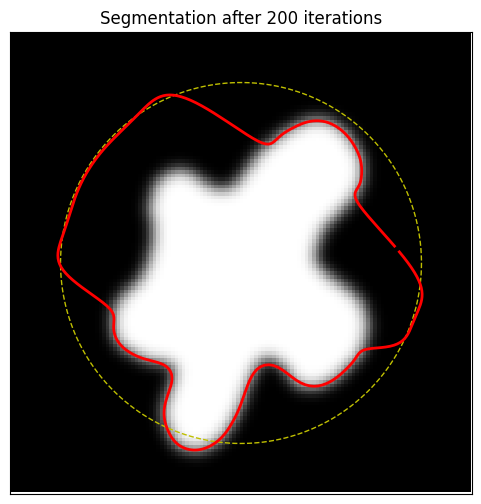

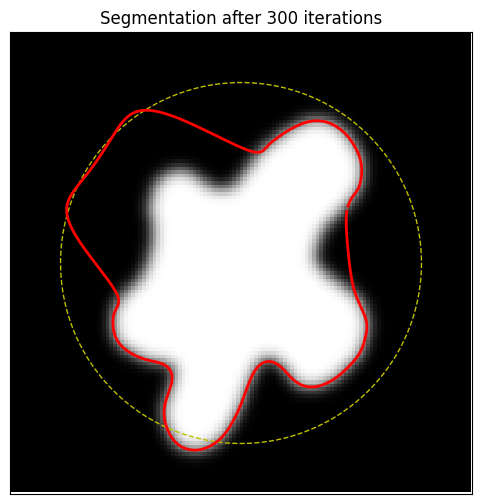

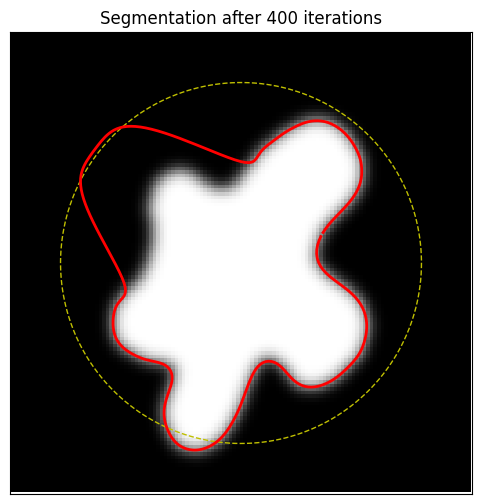

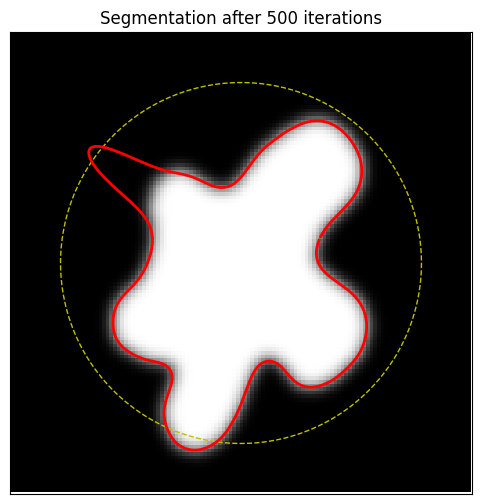

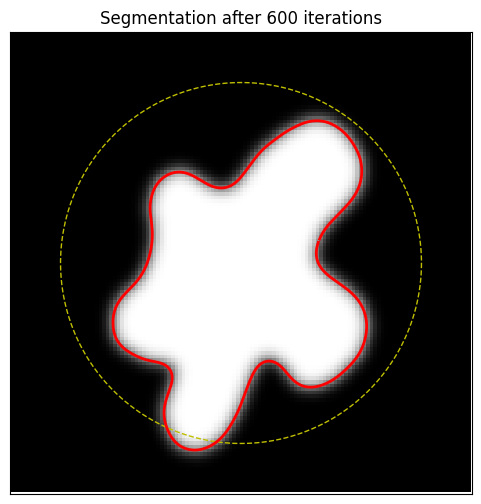

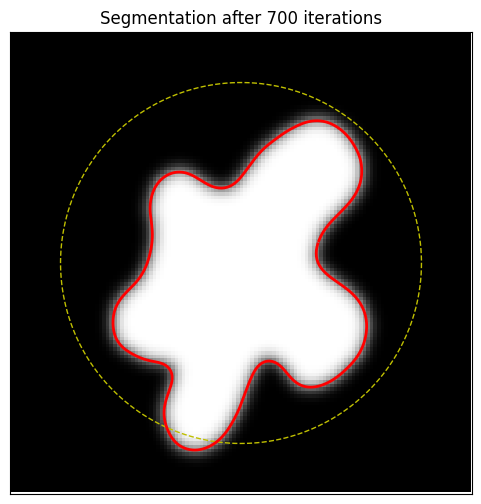

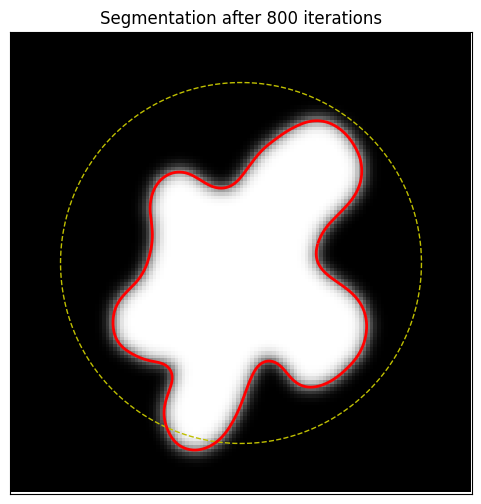

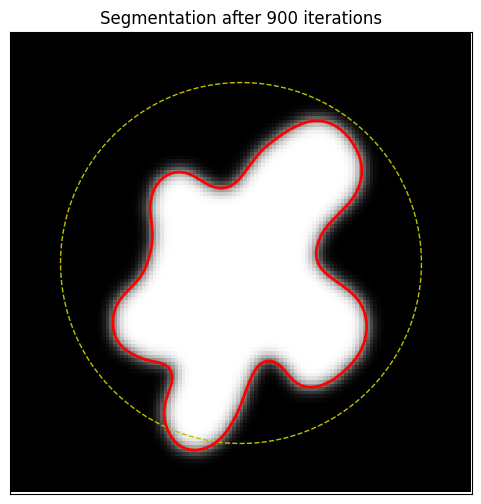

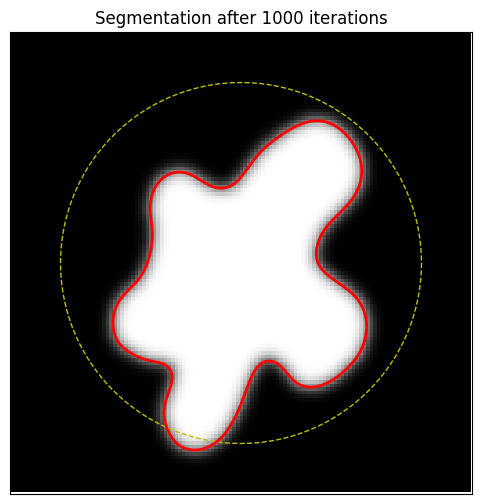

In [ ]:
Bonus_1(img = img_star)

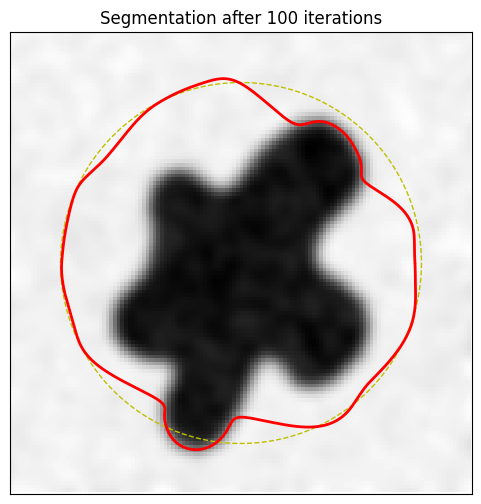

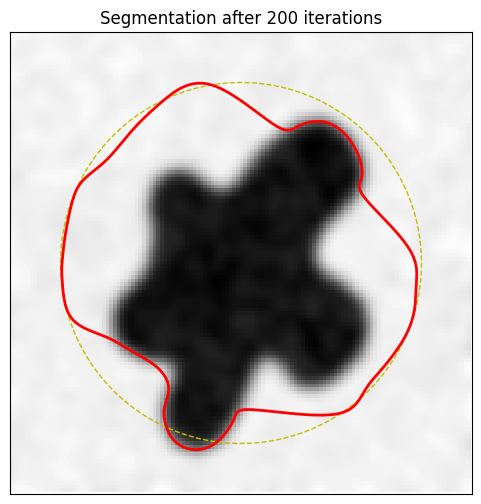

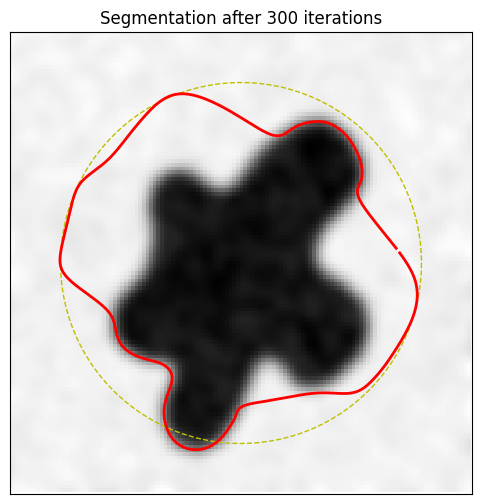

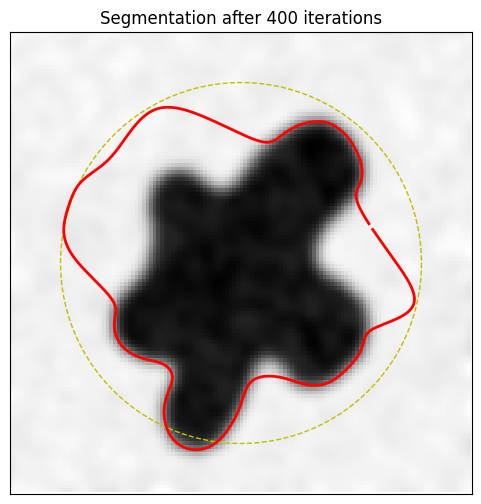

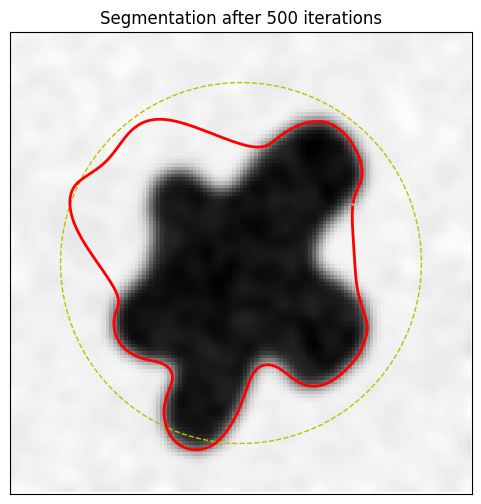

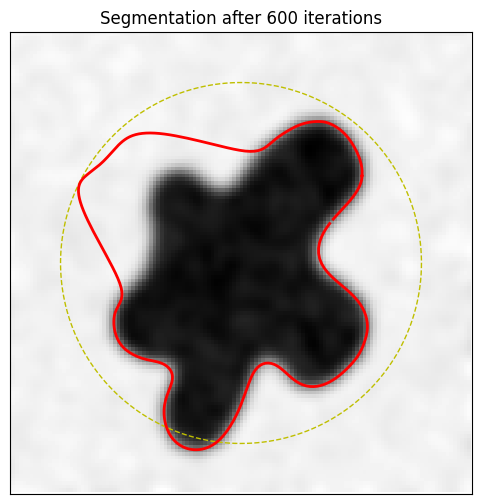

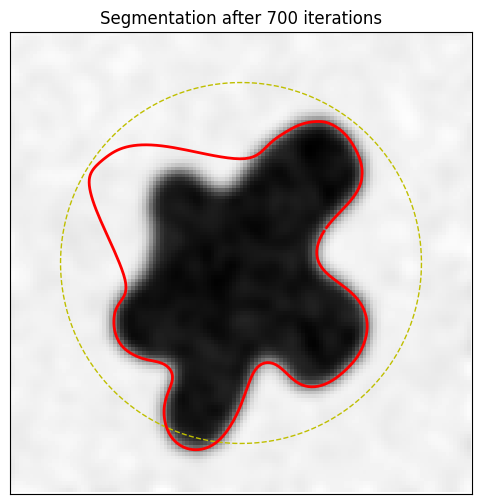

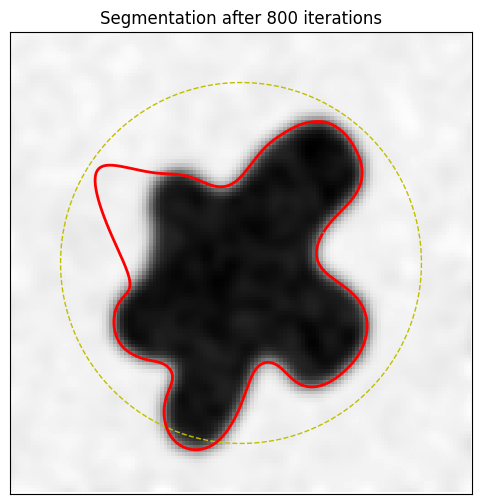

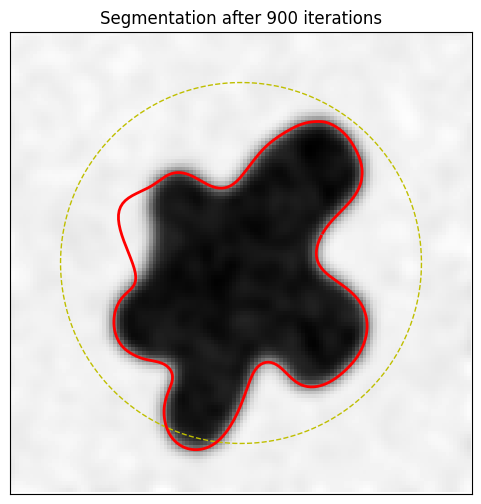

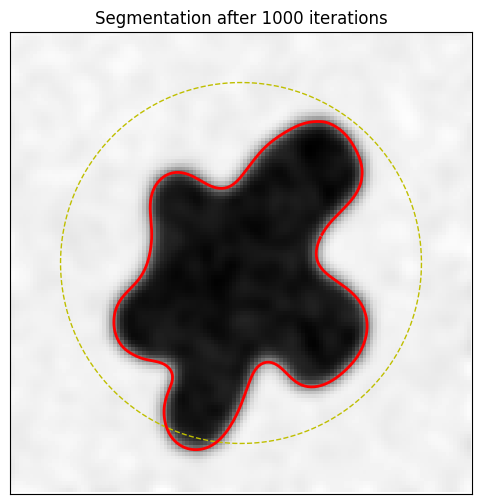

In [ ]:
Bonus_1(img = img_star_noisy)

# Seg #2:
### Snake on a real image

We are using here **img_to_seg   = img_cell** for which you have a ground truth mask of the target segmentation for the dark cell.  

## TODO
1. **Segment left cell**:
    1. Run with the proposed initialisation and see that the active contour can be initialised inside the object. Give some intuition on why.
2. **Segment right cell**:
    1. Run with the proposed initialisation and see that the active contour cannot be initialised inside the object now. Give some intuition on why.
    2. Change the parameter **Niter_smooth** while keeping snake parameters constant and give an intuition on why the final contour evolves as seen.
    1. Change the initial contour parameters to obtain a perfect segmentation.
3. BONUS: If you know that you are aiming for the darkest cell in the image, propose an automated initialisation of the initial active contour parameters [r0 ; c0; R0 ] that works on this image.



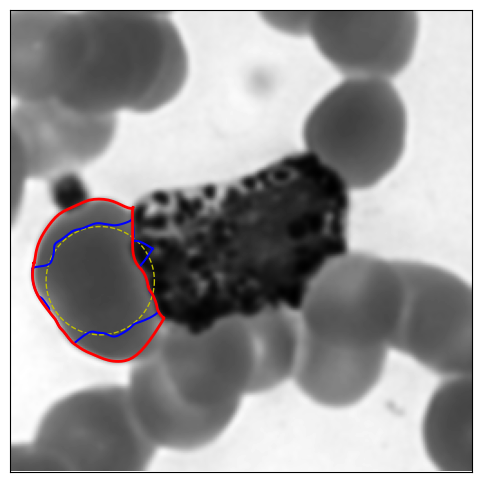

In [ ]:

# Input image and parameter values
img_to_seg   =  img_cell;

# 1st SEG: To segment left cell
r0 = 150; c0=50; R0 = 30
alpha_val = 0.01 ; beta_val = 0.1 ;gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 200;

# 2nd SEG: To segment center dark cell
# r0 = 130; c0=120; R0 = 30
# alpha_val = 0.01 ; beta_val = 0.1 ;gamma_val = 0.01;
# convergence_val = 1e-4; Niter_snake = 800;



# Pre smooth the image
Niter_smooth = 1
img_to_seg   = gaussian(img_to_seg, Niter_smooth, preserve_range=False)


# Initialise contour
init = define_initial_circle(R0,r0,c0)

# Run active contour
snake30 = active_contour(img_to_seg,
                       init, max_num_iter=30, convergence=convergence_val,
                         alpha=alpha_val, beta=beta_val, gamma=gamma_val)
snake = active_contour(img_to_seg,
                       init, max_num_iter=Niter_snake, convergence=convergence_val,
                       alpha=alpha_val, beta=beta_val, gamma=gamma_val)

# Display results
fig, ax = plt.subplots(figsize=(6, 6))
ax.imshow(img_to_seg, cmap=plt.cm.gray)
ax.plot(init[:, 1], init[:, 0], '--y', lw=1)
ax.plot(snake30[:, 1], snake30[:, 0], '-b', lw=1.5)
ax.plot(snake[:, 1], snake[:, 0], '-r', lw=2)
ax.set_xticks([]), ax.set_yticks([])
ax.axis([0, img_to_seg.shape[1], img_to_seg.shape[0], 0])

plt.show();

1)

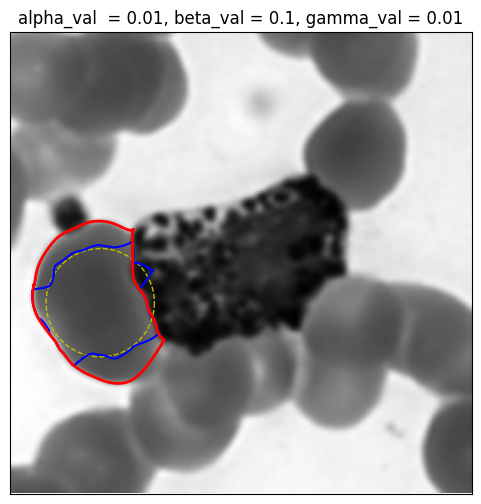

In [ ]:
# 1st SEG: To segment left cell
segment_img(img_to_seg = img_cell, r0 = 150, c0=50, R0 = 30, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01, num_iter=30, Niter_snake = 200)


When running with the proposed initialization (r0 = 150, c0 = 50, R0 = 30) for the left cell, the active contour can be initialized inside the object successfully. The smooth dark gray color of the left cell provides a more homogeneous and less textured region. The initial contour is likely placed within the approximate boundaries of the object, and the active contour algorithm encounters attractive forces from the homogeneous interior, facilitating convergence toward the desired object boundaries.

2)

1.

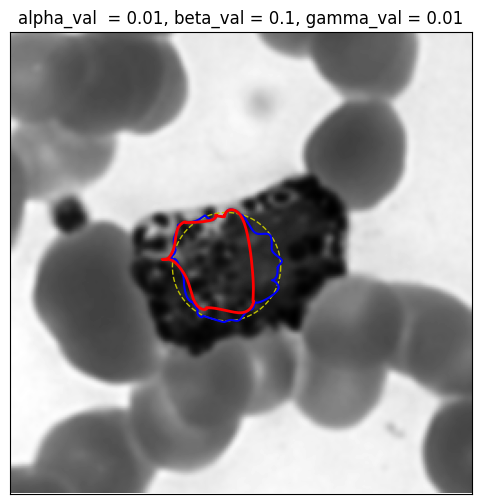

In [ ]:
# 2nd SEG: To segment center dark cell
segment_img(img_to_seg = img_cell, r0 = 130, c0=120, R0 = 30, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01, num_iter=30, Niter_snake = 800)

1. when running with the same proposed initialization for the right cell, The active contour struggles to start inside the object, mainly due to intricate textures in that region. Placing the contour inside triggers forces that push it away, influenced by the detailed textures. This texture complexity makes it hard for the contour to smoothly reach the correct boundaries during the initial setup.

Niter_smooth =   1


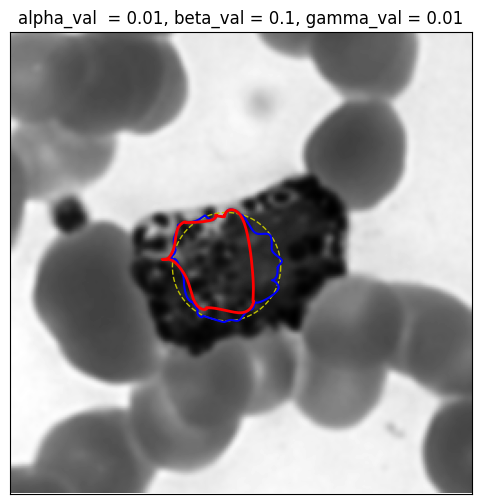

Niter_smooth =   2


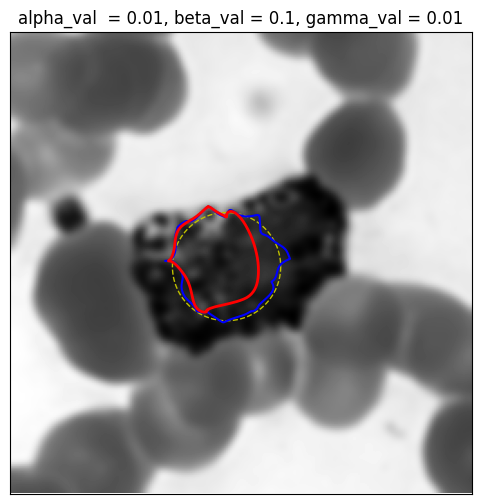

Niter_smooth =   3


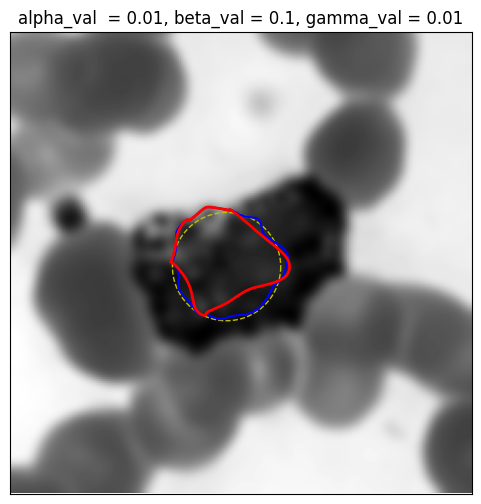

Niter_smooth =   4


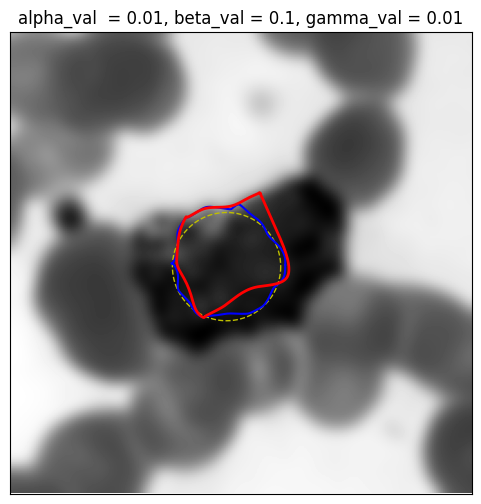

Niter_smooth =   5


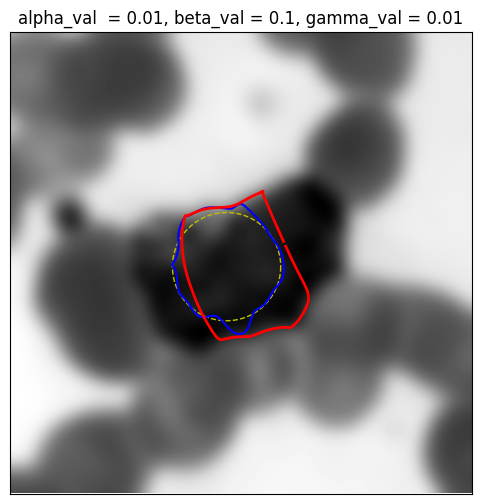

Niter_smooth =   6


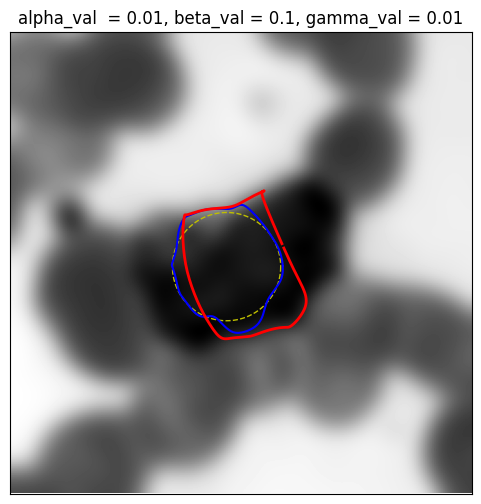

Niter_smooth =   7


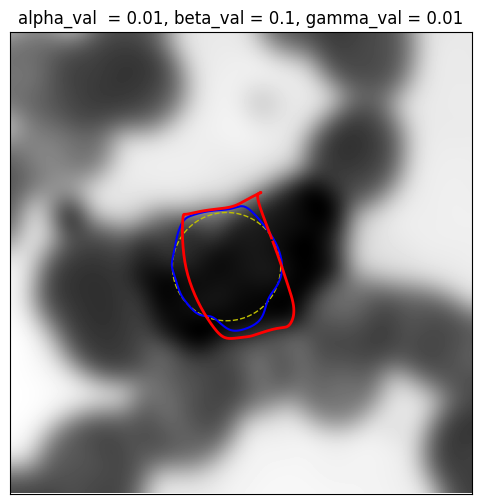

Niter_smooth =   8


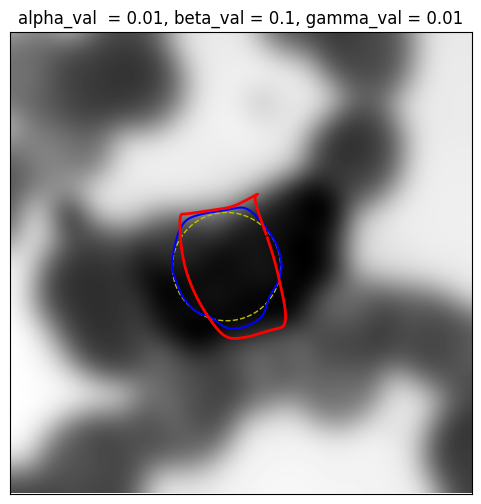

Niter_smooth =   9


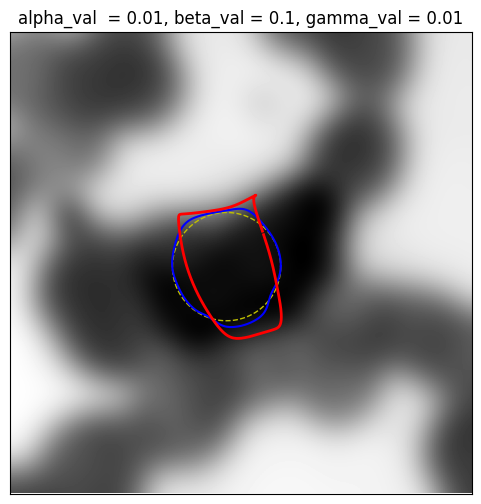

Niter_smooth =   10


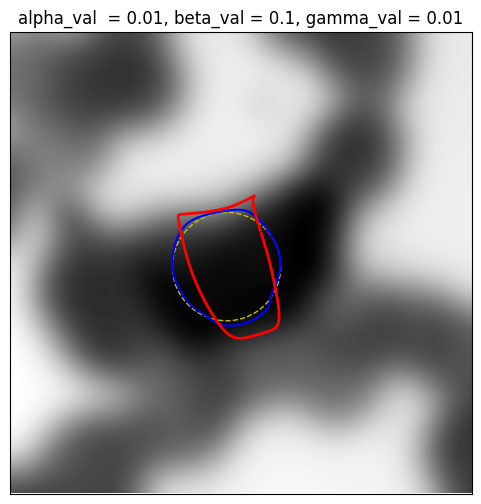

In [ ]:
for i in range (1,11):
  print("Niter_smooth =  ", i)
  segment_img(img_to_seg = img_cell, r0 = 130, c0=120, R0 = 30, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01, num_iter=30, Niter_snake = 800,  Niter_smooth = i)

2. Increasing Niter_smooth involves intensifying pre-smoothing iterations before applying the active contour algorithm. this leads to a more pronounced blurring effect on the image. This process initially enhances segmentation results from 1 to 5 iterations by reducing noise and refining the contour. However, beyond 5 iterations, the excessive Niter_smooth causes oversmoothing, resulting in a loss of critical details and a decline in segmentation accuracy.

3. To obtain a perfect segmentation, the initial contour parameters were adjusted by changing the radius to R0 = 69. This adjustment proved effective in achieving an accurate segmentation. However, it's crucial to note that for R0 values greater than 69, the contour fails to converge properly and extends outside the shape.

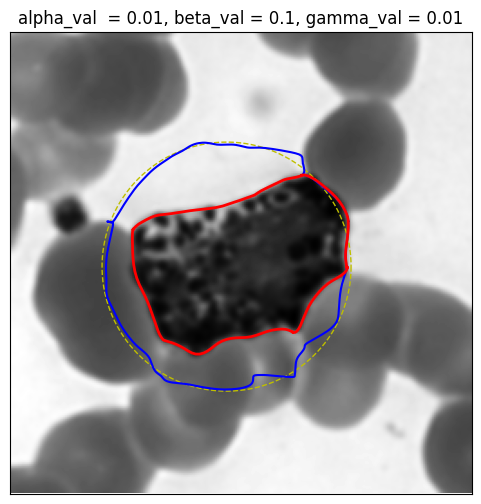

In [ ]:
# 2nd SEG: To segment center dark cell
segment_img(img_to_seg = img_cell, r0 = 130, c0=120, R0 = 69, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01, num_iter=30, Niter_snake = 800)

for R0 = 70

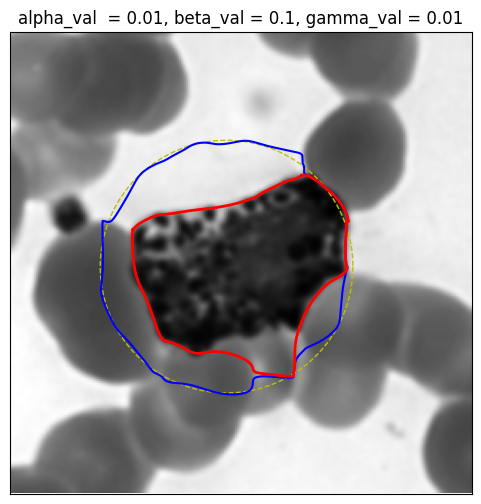

In [ ]:
# 2nd SEG: To segment center dark cell
segment_img(img_to_seg = img_cell, r0 = 130, c0=120, R0 = 70, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01, num_iter=30, Niter_snake = 800)

3)

In [ ]:
from skimage import measure
from sklearn.cluster import KMeans

def automated_initialization(img, n_clusters=3, Niter_smooth = 1):
    # Pre smooth the image
    gray_img   = gaussian(img, Niter_smooth, preserve_range=False)
    # Reshape the 2D image into a 1D array
    pixels = gray_img.ravel().reshape(-1, 1)

    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(pixels)

    # Find the cluster with the darkest mean intensity
    darkest_cluster_label = np.argmin(kmeans.cluster_centers_)

    # Assign pixels to the darkest cluster
    binary_img = (kmeans.labels_ == darkest_cluster_label).reshape(gray_img.shape)
    plt.imshow(binary_img)
    plt.show()
    # Label connected components
    labeled_cells = measure.label(binary_img)
    plt.imshow(labeled_cells)
    plt.show()

    # Find the region with the lowest mean intensity (darkest)
    darkest_region = np.argmin([np.mean(gray_img[labeled_cells == label]) for label in range(1, labeled_cells.max() + 1)]) + 1

    # Get properties of the darkest region
    region_props = measure.regionprops(labeled_cells)
    centroid = np.round(region_props[darkest_region - 1].centroid).astype(int)
    bbox_minr, bbox_minc, bbox_maxr, bbox_maxc = region_props[darkest_region - 1].bbox

    # Estimate radius as half of the maximum dimension of the bounding box
    radius = max(bbox_maxr - bbox_minr, bbox_maxc - bbox_minc) // 2 + 1

    return centroid[0], centroid[1], radius

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


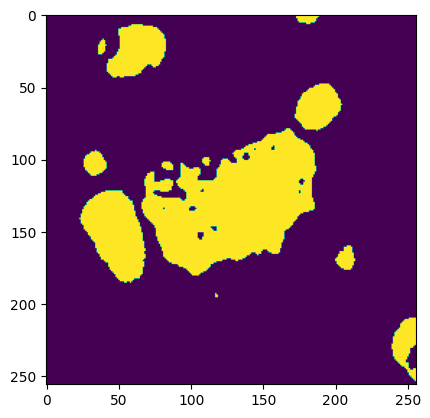

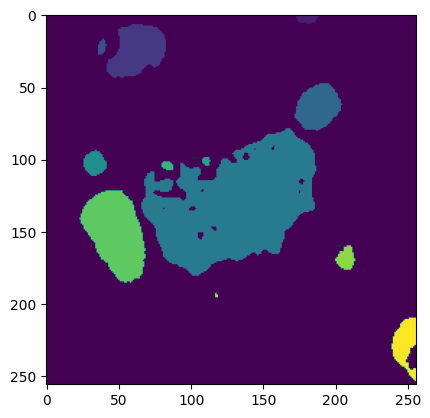

Automated Initialization for Darkest Cell: r0=131, c0=130, R0=61


In [ ]:
# Automated initialization for the darkest cell
r0_opt, c0_opt, R0_opt, = automated_initialization(img_cell)
print(f"Automated Initialization for Darkest Cell: r0={r0_opt}, c0={c0_opt}, R0={R0_opt}")

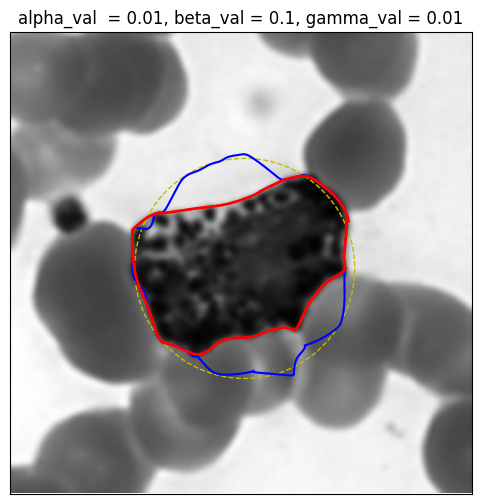

In [ ]:
# 2nd SEG: To segment center dark cell
segment_img(img_to_seg = img_cell, r0 = r0_opt, c0= c0_opt, R0 = R0_opt, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.01, num_iter=30, Niter_snake = 800)

# Seg # 3

### A tool to visualise the deformations of the snake


## TO DO:
1. **Segment left cell**:
    1. Provide your comments on the deformation pattern of the snake.
    1. Why iteration time steps get slower over iterations when initialising from the inside?
1. **Segment right cell**:
     1. Use your optimal parameters from previous cell and comment on the deformation patterns.

start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


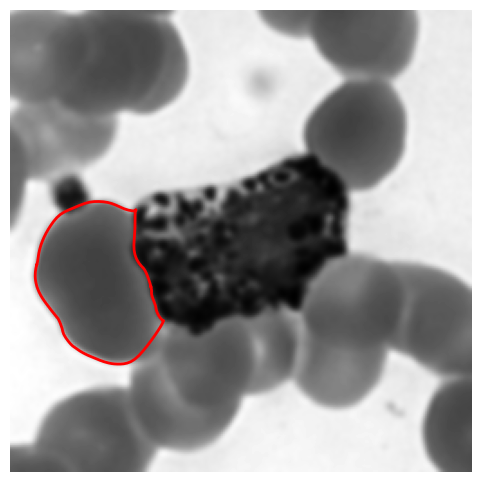

In [ ]:
img_to_seg        = img_cell

# 1st SEG: To segment left cell
r0 = 150; c0=50; R0 = 30
alpha_val = 0.01 ; beta_val = 0.1 ;gamma_val = 0.01; convergence_val = 1e-4; Niter_snake = 200;

# 2nd SEG: To segment center dark cell
#r0 = 130; c0=120; R0 = 30 # initialise inside
#alpha_val = 0.01 ; beta_val = 0.1 ;gamma_val = 0.01; convergence_val = 1e-4; Niter_snake = 200;

# Pre smooth the image
Niter_smooth = 1
img_to_seg   = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Initialise contour
init = define_initial_circle(R0,r0,c0)


# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(img_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(img_to_seg, segs);
HTML(anim.to_html5_video())

1) Segment left cell:

1. The deformation pattern of the snake for the left cell shows a gradual adjustment of the contour to the boundaries of the cell. Initially, the contour quickly adapts to the shape, but as the iterations progress, the changes become more subtle, indicating convergence towards the final stable contour. The snake tends to refine its position and shape to match the cell boundaries accurately.

2. The slowing down of iteration time steps when initializing from the inside can be attributed to the snake reaching a state of equilibrium where the contour closely aligns with the object boundaries. As the contour approaches the optimal configuration, further adjustments require finer changes, leading to a slower convergence rate.

start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  201  211  221  231  241  251  261  271  281  291  301  311  321  331  341  351  361  371  381  391  401  411  421  431  441  451  461  471  481  491  501  511  521  531  541  551  561  571  581  591  stop


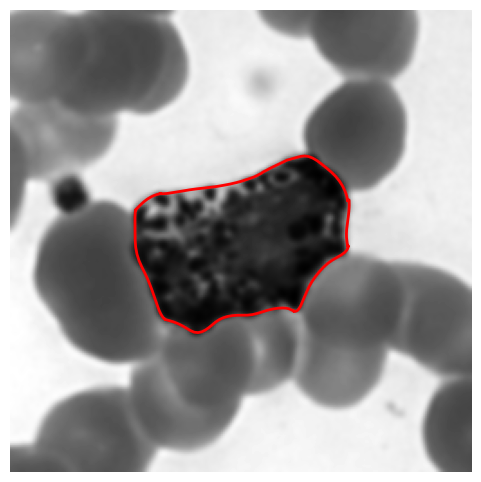

In [ ]:
img_to_seg        = img_cell

# 1st SEG: To segment left cell
# r0 = 150; c0=50; R0 = 30
# alpha_val = 0.01 ; beta_val = 0.1 ;gamma_val = 0.01; convergence_val = 1e-4; Niter_snake = 200;

# 2nd SEG: To segment center dark cell
r0=131; c0=130; R0=61
alpha_val = 0.01 ; beta_val = 0.1 ;gamma_val = 0.01; convergence_val = 1e-4; Niter_snake = 600;

# Pre smooth the image
Niter_smooth = 1
img_to_seg   = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Initialise contour
init = define_initial_circle(R0,r0,c0)


# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(img_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(img_to_seg, segs);
HTML(anim.to_html5_video())

2) Segment right cell:

Utilizing the optimal parameters obtained from the previous cell, the deformation pattern for the right cell showcases a similar behavior. The snake progressively refines its contour to match the intricate boundaries of the darker cell. The initial iterations witness significant adjustments as the snake adapts to the general shape, while subsequent iterations result in finer refinements. The convergence is smoother, and the deformation pattern reflects a more controlled and gradual evolution towards the optimal contour. The optimal parameters help achieve a balance between sensitivity to image features and stability in the deformation process, leading to an accurate segmentation of the darker cell.

# Seg # 4

### Snake with  Gradient Vector Flow (GVF)
This implementation of the GVF is performed by computing the edge map, diffusing the gradient over the whole image and directly input the GVF_edge_map to be used as external forces by setting w_line=1 and w_edge=0 in the active_contour function.

## TODO:

1. Compare results when segmenting the Edge_map or GVF_map as input to the active_contour routine on 3 images: img_star, img_star_noisy and an image of your choice. Comment on robustness and speed differences.
1. When using GVF_map, test the effect of decreasing by a factor of 10 alpha,beta or gamma and interpret the effect.

1)

1. im_star with Edge_map vs im_star with GVF_map

................................................................................................................................
start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


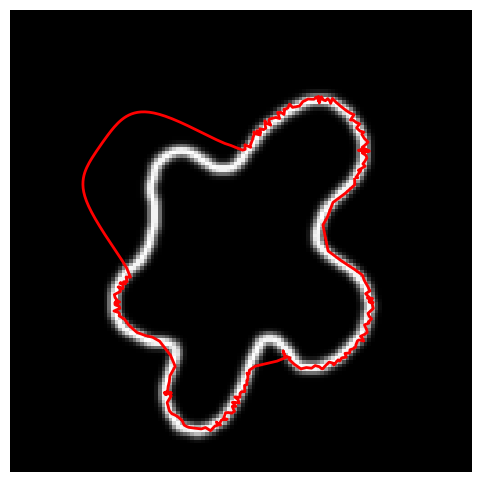

In [ ]:
import gvf_elsa2
from gvf_elsa2 import  gradient_field, gradient_vector_flow


# Image to seg
img_to_seg = img_star
r0 = 64; c0=64; R0 = 50

# Example of another image to test.
# NB: play with regularisation  parameter mu for gradient_vector_flow on real images
# img_to_seg        = img_cell
# r0 = 130; c0=120; R0 = 50 # initialise inside

alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 200;


# Initialise contour
init        = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Compute edge map and gvf
img_to_seg = img_to_seg.astype(np.float32) / np.max(img_to_seg)
Edge_map   = edge_map(img_to_seg,sigma=1)

fx, fy = gradient_field(img_to_seg) # ELSA CORRECTED - was calling with Edge_map as input
gx, gy = gradient_vector_flow(fx, fy, mu=5)
GVF_map = np.sqrt(gx**2 + gy**2)

# Run active contour while saving intermediate contours to see deformations
Map_to_seg = Edge_map

# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(Map_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                    w_line=1,w_edge=0))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(Map_to_seg, segs);
HTML(anim.to_html5_video())

................................................................................................................................
start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


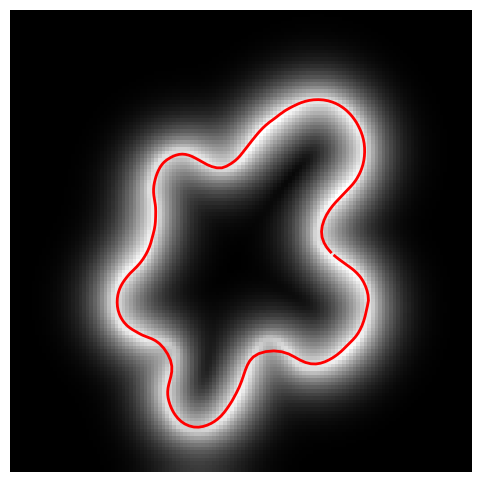

In [ ]:
# Image to seg
img_to_seg = img_star
r0 = 64; c0=64; R0 = 50

alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 200;


# Initialise contour
init        = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Compute edge map and gvf
img_to_seg = img_to_seg.astype(np.float32) / np.max(img_to_seg)
Edge_map   = edge_map(img_to_seg,sigma=1)

fx, fy = gradient_field(img_to_seg) # ELSA CORRECTED - was calling with Edge_map as input
gx, gy = gradient_vector_flow(fx, fy, mu=80)
GVF_map = np.sqrt(gx**2 + gy**2)

# Run active contour while saving intermediate contours to see deformations
Map_to_seg = GVF_map

# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(Map_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                    w_line=1,w_edge=0))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(Map_to_seg, segs);
HTML(anim.to_html5_video())

- Convergence Speed: The GVF_map shows faster convergence compared to the Edge_map. This is likely because the GVF_map provides a more consistent and smoothed vector field, guiding the contour more efficiently.
- Contour Smoothness: The contour obtained with GVF_map appears smoother. The regularization introduced by the GVF process contributes to a more refined and stable contour, reducing sensitivity to noise.







2. im_star_noisy with Edge_map vs im_star_noisy with GVF_map:

................................................................................................................................
start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


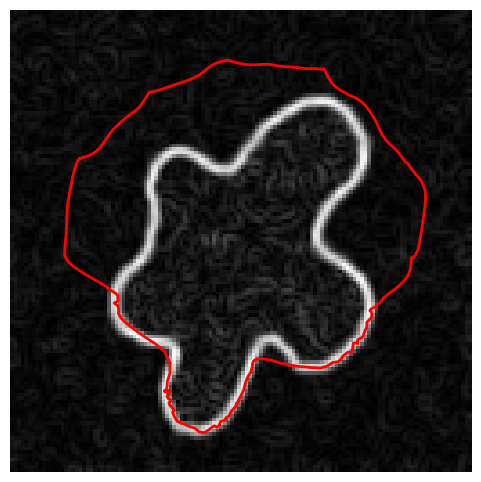

In [ ]:
# Image to seg
img_to_seg = img_star_noisy
r0 = 64; c0=64; R0 = 50

alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 200;


# Initialise contour
init        = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Compute edge map and gvf
img_to_seg = img_to_seg.astype(np.float32) / np.max(img_to_seg)
Edge_map   = edge_map(img_to_seg,sigma=1)

fx, fy = gradient_field(img_to_seg) # ELSA CORRECTED - was calling with Edge_map as input
gx, gy = gradient_vector_flow(fx, fy, mu=80)
GVF_map = np.sqrt(gx**2 + gy**2)

# Run active contour while saving intermediate contours to see deformations
Map_to_seg = Edge_map

# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(Map_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                    w_line=1,w_edge=0))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(Map_to_seg, segs);
HTML(anim.to_html5_video())

................................................................................................................................
start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


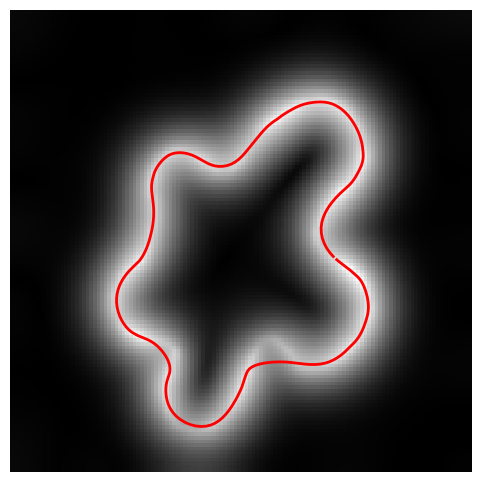

In [ ]:
# Image to seg
img_to_seg = img_star_noisy
r0 = 64; c0=64; R0 = 50

alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 200;


# Initialise contour
init        = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Compute edge map and gvf
img_to_seg = img_to_seg.astype(np.float32) / np.max(img_to_seg)
Edge_map   = edge_map(img_to_seg,sigma=1)

fx, fy = gradient_field(img_to_seg) # ELSA CORRECTED - was calling with Edge_map as input
gx, gy = gradient_vector_flow(fx, fy, mu=40)
GVF_map = np.sqrt(gx**2 + gy**2)

# Run active contour while saving intermediate contours to see deformations
Map_to_seg = GVF_map

# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(Map_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                    w_line=1,w_edge=0))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(Map_to_seg, segs);
HTML(anim.to_html5_video())

- Convergence Speed: Similar to im_star, GVF_map converges faster than Edge_map. The noise robustness of GVF is advantageous in challenging conditions, resulting in quicker convergence.
- Contour Accuracy: GVF_map is more likely to maintain accurate contours in the presence of noise. The enhanced smoothing helps prevent the contour from being overly influenced by noisy image details.


3. im_cell with Edge_map vs im_cell with GVF_map:

................................................................................................................................................................................................................................................................
start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


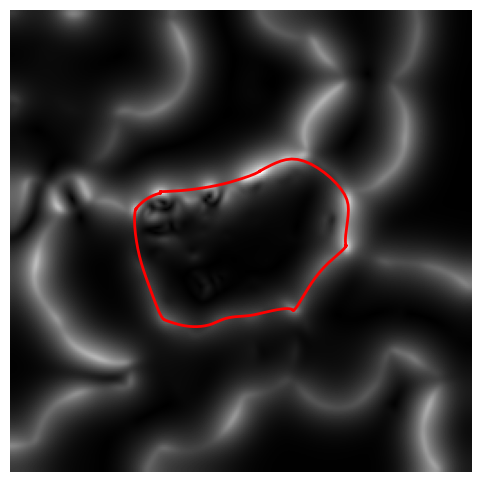

In [ ]:
# Image to seg
img_to_seg        = img_cell
r0 = 130; c0=120; R0 = 50 # initialise inside

alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 200;


# Initialise contour
init        = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Compute edge map and gvf
img_to_seg = img_to_seg.astype(np.float32) / np.max(img_to_seg)
Edge_map   = edge_map(img_to_seg,sigma=1)

fx, fy = gradient_field(img_to_seg) # ELSA CORRECTED - was calling with Edge_map as input
gx, gy = gradient_vector_flow(fx, fy, mu=5)
GVF_map = np.sqrt(gx**2 + gy**2)

# Run active contour while saving intermediate contours to see deformations
Map_to_seg = GVF_map

# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(Map_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                    w_line=1,w_edge=0))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(Map_to_seg, segs);
HTML(anim.to_html5_video())

................................................................................................................................................................................................................................................................
start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


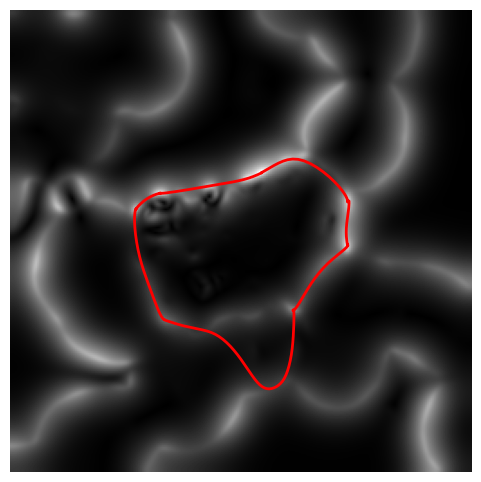

In [ ]:
# Image to seg
img_to_seg        = img_cell
r0=131; c0=130; R0=61

alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 200;


# Initialise contour
init        = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Compute edge map and gvf
img_to_seg = img_to_seg.astype(np.float32) / np.max(img_to_seg)
Edge_map   = edge_map(img_to_seg,sigma=1)

fx, fy = gradient_field(img_to_seg) # ELSA CORRECTED - was calling with Edge_map as input
gx, gy = gradient_vector_flow(fx, fy, mu=5)
GVF_map = np.sqrt(gx**2 + gy**2)

# Run active contour while saving intermediate contours to see deformations
Map_to_seg = GVF_map

# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(Map_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                    w_line=1,w_edge=0))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(Map_to_seg, segs);
HTML(anim.to_html5_video())

- Inside Initialization: GVF_map demonstrates better handling of inside initialization in im_cell. The GVF-generated vector field provides a more stable and coherent evolution of the contour even when initiated inside the object.
- Convergence Accuracy: When initialized with the optimal contour from the Edge_map, GVF_map might face challenges in convergence, especially when a part of the contour converges to another cell. This behavior suggests that GVF_map's smoothing effect can potentially oversmooth and merge contours.


2)

1. decreasing alpha by 10

................................................................................................................................
start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


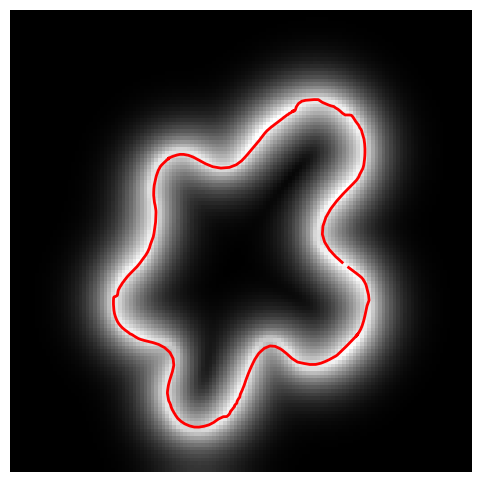

In [ ]:
# Image to seg
img_to_seg = img_star
r0 = 64; c0=64; R0 = 50

alpha_val  = 0.001 ; beta_val = 0.1; gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 200;


# Initialise contour
init        = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Compute edge map and gvf
img_to_seg = img_to_seg.astype(np.float32) / np.max(img_to_seg)
Edge_map   = edge_map(img_to_seg,sigma=1)

fx, fy = gradient_field(img_to_seg) # ELSA CORRECTED - was calling with Edge_map as input
gx, gy = gradient_vector_flow(fx, fy, mu=40)
GVF_map = np.sqrt(gx**2 + gy**2)

# Run active contour while saving intermediate contours to see deformations
Map_to_seg = GVF_map

# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(Map_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                    w_line=1,w_edge=0))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(Map_to_seg, segs);
HTML(anim.to_html5_video())

Alpha (Elasticity):

Decreasing alpha reduces the elasticity of the contour, making it less responsive to local image features and less likely to deform to fit fine details.
The contour becomes stiffer, limiting its ability to adapt to subtle variations in the image.

decreasing beta by 10

................................................................................................................................
start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


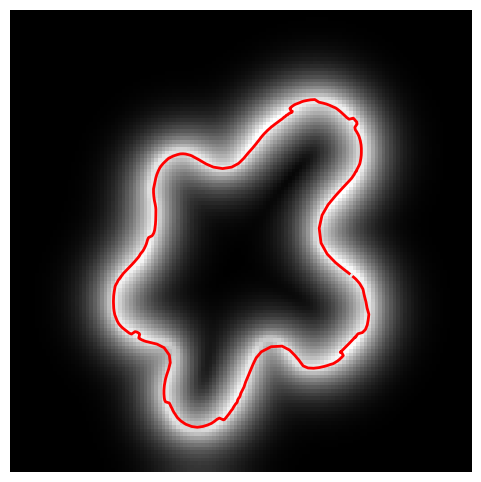

In [ ]:
# Image to seg
img_to_seg = img_star
r0 = 64; c0=64; R0 = 50

alpha_val  = 0.01 ; beta_val = 0.01; gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 200;


# Initialise contour
init        = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Compute edge map and gvf
img_to_seg = img_to_seg.astype(np.float32) / np.max(img_to_seg)
Edge_map   = edge_map(img_to_seg,sigma=1)

fx, fy = gradient_field(img_to_seg) # ELSA CORRECTED - was calling with Edge_map as input
gx, gy = gradient_vector_flow(fx, fy, mu=40)
GVF_map = np.sqrt(gx**2 + gy**2)

# Run active contour while saving intermediate contours to see deformations
Map_to_seg = GVF_map

# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(Map_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                    w_line=1,w_edge=0))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(Map_to_seg, segs);
HTML(anim.to_html5_video())

Beta (Rigidity):

Reducing beta enhances contour flexibility, allowing it to flex more freely. However, very low beta values can increase sensitivity to fine details, potentially compromising stability. Inadequate regularization from the internal energy term may introduce irregularities, causing the contour to oscillate or deviate from desired object boundaries, resulting in less accurate segmentation.

................................................................................................................................
start
1  11  21  31  41  51  61  71  81  91  101  111  121  131  141  151  161  171  181  191  stop


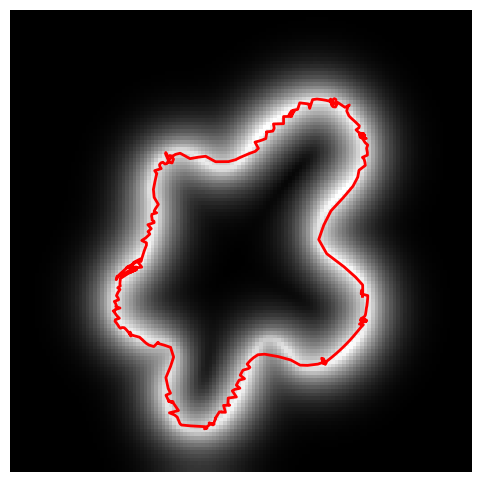

In [ ]:
# Image to seg
img_to_seg = img_star
r0 = 64; c0=64; R0 = 50

alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.001;
convergence_val = 1e-4; Niter_snake = 200;


# Initialise contour
init        = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Compute edge map and gvf
img_to_seg = img_to_seg.astype(np.float32) / np.max(img_to_seg)
Edge_map   = edge_map(img_to_seg,sigma=1)

fx, fy = gradient_field(img_to_seg) # ELSA CORRECTED - was calling with Edge_map as input
gx, gy = gradient_vector_flow(fx, fy, mu=40)
GVF_map = np.sqrt(gx**2 + gy**2)

# Run active contour while saving intermediate contours to see deformations
Map_to_seg = GVF_map

# Run active contour while saving intermediate contours to see deformations
segs = []
print('start')
for i in range(1,Niter_snake,10):
    print(i, " ", end='')
    segs.append(active_contour(Map_to_seg, init, max_num_iter=i, convergence=convergence_val,
                alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                    w_line=1,w_edge=0))

print('stop')
np.save('ANIM_contours.npy', np.array(segs))

# display animation
segs = np.load('ANIM_contours.npy')
anim = animate_snake(Map_to_seg, segs);
HTML(anim.to_html5_video())

Gamma (Explicit Time Stepping):

A very low gamma slows down the convergence of the active contour.
The contour might take a longer time to adapt to the image features, leading to sluggish convergence.

Small fluctuations or irregularities in the image might have a more pronounced impact on the evolving contour.

# Seg # 5:

### The active contour with fixed end points
You will now run the active_contour with the option to maintain some points from the inital contour fixed. You are working now with the img_nodule which is an ultrasound showing different layers of tissue under the skin surface.

## TO DO:
* Write a loop to vary the initial line vertical position by few pixels and propose a method to aggregate final contours, like for example a probability edge map.
* BONUS: Propose and implement a metric to measure the "quality" of the segmented contour, as being representative of the "interface" between two tissues.


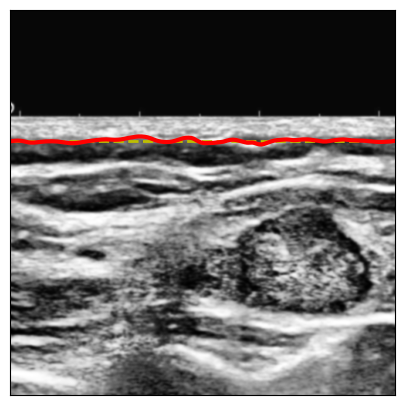

In [ ]:

img_to_seg = img_nodule
r_left = 170; r_right=170; c_left=0; c_right = 780
#r_left = 200; r_right=190; c_left=0; c_right = 780
#r_left = 230; r_right=210; c_left=0; c_right = 780

alpha_val  = 0.01 ; beta_val = 0.1; gamma_val = 0.01;
convergence_val = 1e-4; Niter_snake = 500;
w_line_val=0; w_edge_val=1

# Pre smooth the image
img_to_seg   = skimage.exposure.equalize_adapthist(img_to_seg, clip_limit=0.03)
Niter_smooth = 1
img_to_seg   = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Initialise contour
Nber_pts_contour = 300
r          = np.linspace(r_left, r_right, Nber_pts_contour)
c          = np.linspace(c_left, c_right, Nber_pts_contour)
init       = np.array([r, c]).T


snake_0 = active_contour(img_to_seg,
                       init, boundary_condition='fixed-fixed',max_num_iter=Niter_snake,
                       alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                       w_line=w_line_val, w_edge=w_edge_val)

fig, ax = plt.subplots(figsize=(9, 5));
ax.imshow(img_to_seg[0:500,:], cmap=plt.cm.gray);
ax.plot(init[:, 1], init[:, 0], '--y', lw=2);
ax.plot(snake_0[:, 1], snake_0[:, 0], '-r', lw=3);
ax.set_xticks([]), ax.set_yticks([]);
ax.set(xlim=(0, 500));
plt.show();

In [ ]:
from skimage import exposure

# Initialize parameters
img_to_seg = img_nodule
r_left = 170; r_right = 170; c_left = 0; c_right = 780
alpha_val = 0.01; beta_val = 0.1; gamma_val = 0.01
convergence_val = 1e-4; Niter_snake = 500
w_line_val = 0; w_edge_val = 1

# Preprocess the image
img_to_seg = exposure.equalize_adapthist(img_to_seg, clip_limit=0.03)
Niter_smooth = 1
img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Initialize contour
Nber_pts_contour = 300
r = np.linspace(r_left, r_right, Nber_pts_contour)
c = np.linspace(c_left, c_right, Nber_pts_contour)
init = np.array([r, c]).T

# Loop to vary the initial line's vertical position
num_variations = 20
contours = []

for i in range(-num_variations, num_variations + 1):
    init_variation = init.copy()
    init_variation[:, 0] += i  # Vary the vertical position
    snake = active_contour(img_to_seg,
                           init_variation, boundary_condition='fixed-fixed', max_num_iter=Niter_snake,
                           alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                           w_line=w_line_val, w_edge=w_edge_val)
    contours.append(snake)

([], [])

[(0.0, 500.0)]

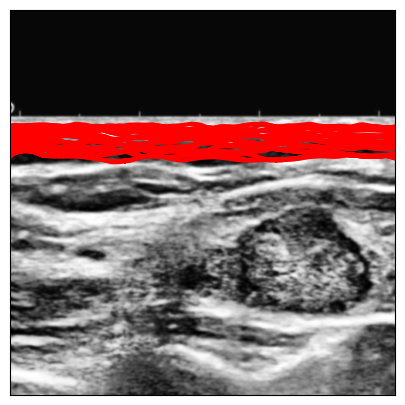

In [ ]:
# Display the results
fig, ax = plt.subplots(figsize=(9, 5))
ax.imshow(img_to_seg[0:500, :], cmap=plt.cm.gray)

# Plot all contours
for snake in contours:
    ax.plot(snake[:, 1], snake[:, 0], '-r', lw=3)

ax.set_xticks([]), ax.set_yticks([])
ax.set(xlim=(0, 500))
plt.show()

(([], []), ([], []))

(0.0, 500.0)

(500.0, 0.0)

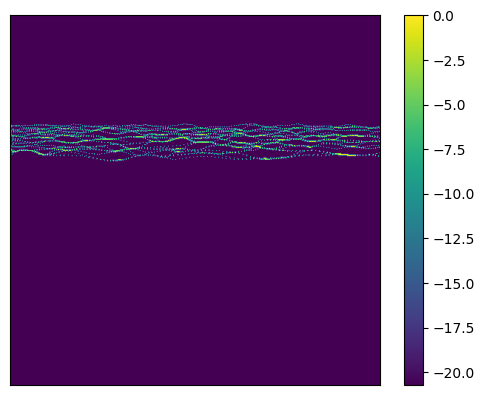

In [ ]:
# Aggregate contours to create a probability edge map

shape = np.shape(img_to_seg)
probability_edge_map = np.zeros((shape[0], shape[1]))

for snake in contours:
    snake = np.round(snake).astype(int)
    snake[:, 0] = np.clip(snake[:, 0], 0, shape[0] - 1)
    snake[:, 1] = np.clip(snake[:, 1], 0, shape[1] - 1)
    probability_edge_map[snake[:, 0], snake[:, 1]] += 1

# Normalize the probability edge map
probability_edge_map /= np.max(probability_edge_map)

# Plot the aggregated contour

plt.imshow(np.log(probability_edge_map[0:500, :]+1e-9))
plt.colorbar()

plt.xticks([]), plt.yticks([])
plt.xlim(0, 500)
plt.ylim(500, 0)
plt.show()

([], [])

[(0.0, 500.0)]

[(500.0, 0.0)]

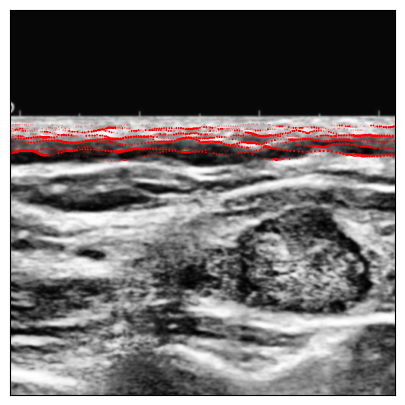

In [ ]:
# Display the results
fig, ax = plt.subplots(figsize=(9, 5))
ax.imshow(img_to_seg[0:500, :], cmap=plt.cm.gray)

# Plot the aggregated contour
ax.contour(probability_edge_map, levels=[0.19], colors='r', linewidths=1)

ax.set_xticks([]), ax.set_yticks([])
ax.set(xlim=(0, 500))
ax.set(ylim=(500, 0))
plt.show()


In [ ]:
snake = np.round(snake_0).astype(int)
snake[:, 0] = np.clip(snake[:, 0], 0, shape[0] - 1)
snake[:, 1] = np.clip(snake[:, 1], 0, shape[1] - 1)

snake_edge_map = np.zeros((shape[0], shape[1])).astype(int)
snake_edge_map[snake[:, 0], snake[:, 1]] |= 1
np.round(np.sum(probability_edge_map * snake_edge_map.astype(float))).astype(int)

79

# Seg # 6

### Your turn on proposing a motivated pipeline using the snake capabilities from the active_contour function

## TODO:
Choose a new image in the pool provided and propose a segmentation pipeline using the active_contour approach. Options on points to work on include: <br>
* Pre filter the image as you wish
* Manually or automatically position the initial contour
* Provide one segmentation result or merge several solutions in a probability map
* Detect issues in contour shape during deformations and propose an early stop criteria.

(([], []), ([], []))

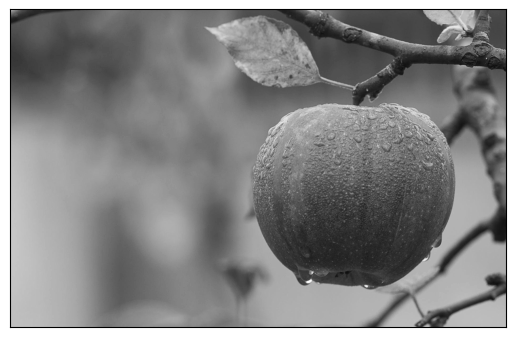

In [ ]:
img_to_seg = skimage.io.imread('./images_misc/gray.jpeg', as_gray = True)
plt.imshow(img_to_seg, cmap=plt.cm.gray)
plt.xticks([]), plt.yticks([])

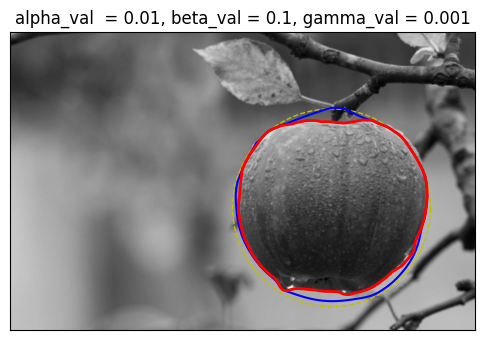

In [ ]:
segment_img(img_to_seg = img_to_seg, r0 = 710, c0=1300, R0 = 400, alpha_val  = 0.01, beta_val = 0.1, gamma_val = 0.001, num_iter=30, Niter_snake = 800, Niter_smooth=2)

In [ ]:
r0 = 710; c0=1300; R0 = 400

alpha_val = 0.01; beta_val = 0.01; gamma_val = 0.001
convergence_val = 1e-4; Niter_snake = 800
w_line_val = 0; w_edge_val = 1

# Preprocess the image
img_to_seg_1 = exposure.equalize_adapthist(img_to_seg, clip_limit=0.03)
Niter_smooth = 2
img_to_seg_1 = gaussian(img_to_seg_1, Niter_smooth, preserve_range=False)

# Initialize contour
init = define_initial_circle(R0,r0,c0,Nber_pts=400)

# Loop to vary the initial line's vertical position
num_variations = 5
contours = []

for i in range(-num_variations, num_variations + 1):
    init_variation = define_initial_circle(R0 + 5 * i, r0,c0,Nber_pts=400)
    snake = active_contour(img_to_seg_1,
                           init_variation, boundary_condition='fixed-fixed', max_num_iter=Niter_snake,
                           alpha=alpha_val, beta=beta_val, gamma=gamma_val,
                           w_line=w_line_val, w_edge=w_edge_val)
    contours.append(snake)

([], [])

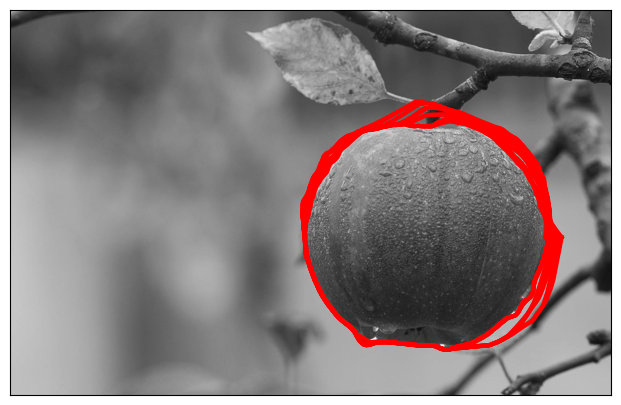

In [ ]:
# Display the results
fig, ax = plt.subplots(figsize=(9, 5))
ax.imshow(img_to_seg, cmap=plt.cm.gray)

# Plot all contours
for snake in contours:
    ax.plot(snake[:, 1], snake[:, 0], '-r', lw=3)

ax.set_xticks([]), ax.set_yticks([])
plt.show()

(1204, 1880)


(([], []), ([], []))

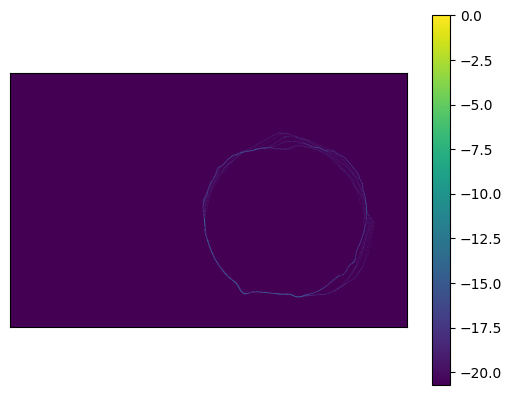

In [ ]:
# Aggregate contours to create a probability edge map

shape = np.shape(img_to_seg)
print(shape)
probability_edge_map = np.zeros((shape[0], shape[1]))

for snake in contours:
    snake = np.round(snake).astype(int)
    snake[:, 0] = np.clip(snake[:, 0], 0, shape[0] - 1)
    snake[:, 1] = np.clip(snake[:, 1], 0, shape[1] - 1)
    probability_edge_map[snake[:, 0], snake[:, 1]] += 1

# Normalize the probability edge map
probability_edge_map /= np.max(probability_edge_map)

# Plot the aggregated contour

plt.imshow(np.log(probability_edge_map + 1e-9))
plt.colorbar()

plt.xticks([]), plt.yticks([])
plt.show()

([], [])

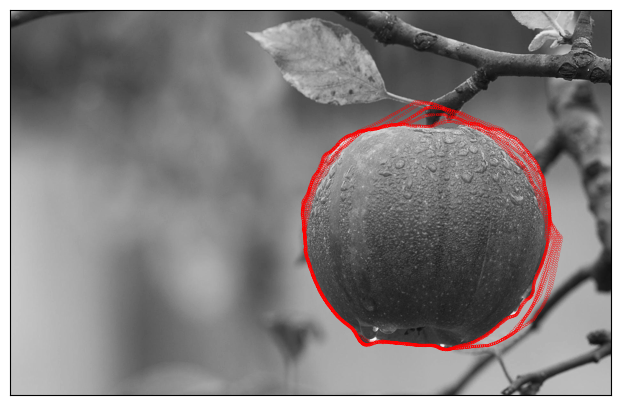

In [ ]:
# Display the results
fig, ax = plt.subplots(figsize=(9, 5))
ax.imshow(img_to_seg, cmap=plt.cm.gray)

# Plot the aggregated contour
ax.contour(probability_edge_map, levels=[0.166], colors='r', linewidths=2)

ax.set_xticks([]), ax.set_yticks([])

plt.show()

As we can see from the probability map, the algorithm converges slowly, and there are some errors in the contour formation. The model requires further fine-tuning to address these issues. Due to the sluggish convergence, the chosen stop criterion is based on the number of iterations, set to 800.

# Seg #7

### Test on the Geometric Level-Set formulation using the Chan-Vese model.
Skimage provides two implementations of the Chan-Vese approach: **morphological_chan_vese** and **chan_vese**. <br>

The contours of ojects are now encoded in a level set function **Phi**.

The **initialisation** tested here is with a "checkerboard" pattern for 2 classes (object and background). <br>

For the **chan_vese** original implementation, the **hyper-parameters** include:<br>
* mu = 0.25 (default) | edge regularisation terms. Similar to ‘edge length’ weight parameter. Higher mu values will produce ‘smoother’ contours.
* dt = 0.5 (default) |  delta time step for each optimisation step.  
* lambda1=1, lambda2=1 (default) | weights in the cost metric to balance inside and outside homogeneity terms.
* tol=1e-3 (default) | Tolerance to test if the contours are "stable" and stop early.

The output contains: cv[0]=Seg and cv[1]=Phi <br>

For the **morphological_chan_vese**  implementation, the only **hyper-parameter** is the number of smoothing iterations (1 to 4 recommended).<br>

## TO DO:
1. C-V ori: Run the code on img_hela. Visualise and explain  evolution of Phi over first iterations. Figure out how to see the initial Phi configuration.
1. Run now on img_cell without and with pre-processing with histogram equalisation and explain difference in results.
1. Propose and implement method(s) and metrics to compare two segmentation results when handling segmentation masks. Use the one(s) implemented to quantify the differences obtained on one test case of your choice with the two implementations of chan-vese provided here.
1. Make the level set work when initialising with "disk" on img_MRIf


1)

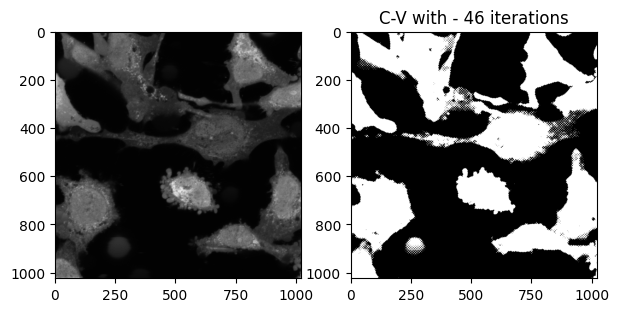

In [ ]:

img_to_seg= img_hela

# PARAMETERS
mu_val=0.5 ; lambda1_val=1; lambda2_val=1; tol_val=1e-3; dt_val=0.5
smoothing_val = 3

Num_iter_cv_ori    = 100
Num_iter_cv_fast   = 1

CHAN_VESE_ORI  = 1
Init_method    = "checkerboard" # "checkerboard" or "disk" or "small disk" (alternative to use to set init_level_set)


# run segmentation
if CHAN_VESE_ORI == 1:
    # STANDARD implementation from original paper
    init_ls = checkerboard_level_set(img_to_seg.shape, 45)

    cv = chan_vese(img_to_seg, mu=mu_val, lambda1=lambda1_val, lambda2=lambda2_val,
                   tol=tol_val, dt=dt_val,
                   max_num_iter=Num_iter_cv_ori, init_level_set=Init_method,
                   extended_output=True)
    fig, ax = plt.subplots(1,2,figsize=(7, 7))
    ax[0].imshow(img_to_seg, cmap=plt.cm.gray)
    ax[1].imshow(1-cv[0], cmap=plt.cm.gray)
    title = f'C-V with - {len(cv[2])} iterations'
    ax[1].set_title(title, fontsize=12)

else:
    # FASTER implementation implemented with morphological operators BUT LESS PRECISE
    cv      = morphological_chan_vese(img_to_seg, num_iter=Num_iter_cv_fast,
                                      smoothing=smoothing_val, init_level_set="checkerboard")
    fig, ax = plt.subplots(1,2,figsize=(7, 7))
    ax[0].imshow(img_to_seg, cmap=plt.cm.gray)
    ax[1].imshow(1-cv, cmap=plt.cm.gray)
    title = f'C-V_morph with - {Num_iter_cv_fast} iterations'
    ax[1].set_title(title, fontsize=12)


plt.show();

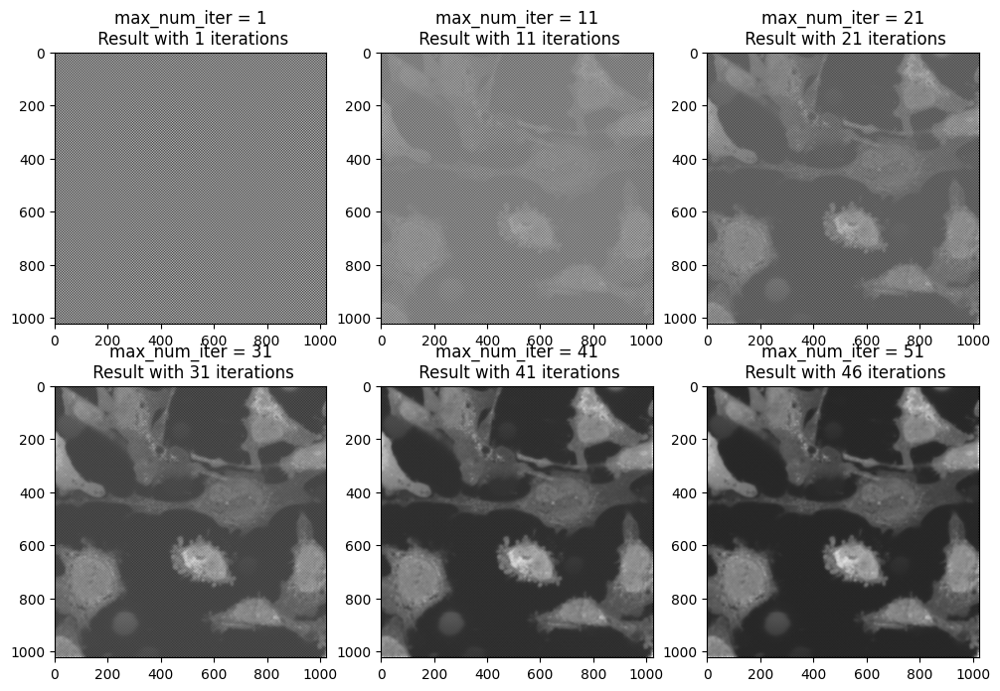

In [ ]:
img_to_seg= img_hela

# PARAMETERS
mu_val=0.5 ; lambda1_val=1; lambda2_val=1; tol_val=1e-3; dt_val=0.5
smoothing_val = 3

Num_iter_cv_ori    = 100
Num_iter_cv_fast   = 1

CHAN_VESE_ORI  = 1
Init_method    = "checkerboard" # "checkerboard" or "disk" or "small disk" (alternative to use to set init_level_set)


# run segmentation
if CHAN_VESE_ORI == 1:
    # STANDARD implementation from original paper
    init_ls = checkerboard_level_set(img_to_seg.shape, 45)


    Num_iter_range  = Num_iter_cv_ori //20 + 1

    fig, ax = plt.subplots(2, (Num_iter_range+1) // 2,figsize=(12, 8))
    n = (Num_iter_range+1) // 2
    for i in range(Num_iter_range):
      Num_iter_i = 10 * i + 1
      cv = chan_vese(img_to_seg, mu=mu_val, lambda1=lambda1_val, lambda2=lambda2_val,
                      tol=tol_val, dt=dt_val,
                      max_num_iter = Num_iter_i, init_level_set=Init_method,
                      extended_output=True)

      ax[i // n, i%n].imshow(1-cv[1], cmap=plt.cm.gray)
      title = f'max_num_iter = {Num_iter_i}\n Result with {len(cv[2])} iterations'
      ax[i // n, i % n].set_title(title)

plt.show();

The evolution of Phi in the Chan-Vese segmentation algorithm unfolds through a series of iterations. In the initial iteration, Phi is initialized with a checkerboard pattern, providing a starting approximation of object boundaries. As the algorithm progresses, Phi undergoes updates aimed at minimizing the energy functional, refining the contours to better fit the actual object shapes in the image. Dark regions in Phi represent evolving object boundaries, while lighter regions denote the background. In the early iterations, Phi may appear coarse and dissimilar to the original image, but with each subsequent iteration, it progressively aligns with the image content. The algorithm continues refining Phi until convergence, where further iterations result in marginal changes. This process captures the evolution of the level set function from its initial approximation towards a configuration that closely resembles the original image, effectively delineating the desired object boundaries.

2)

Text(0.5, 1.0, 'C-V without preprocessing')

Text(0.5, 1.0, 'C-V with histogram equalization')

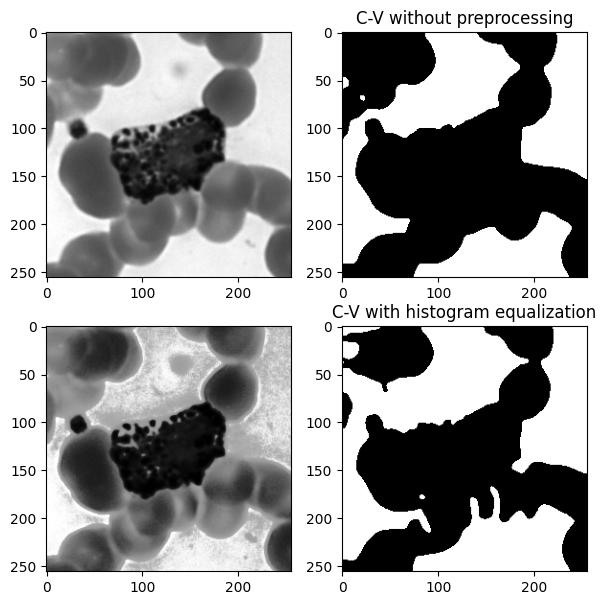

In [ ]:
# Import
from skimage import exposure

# PARAMETERS
mu_val=0.5 ; lambda1_val=1; lambda2_val=1; tol_val=1e-3; dt_val=0.5
smoothing_val = 3

Num_iter_cv_ori    = 100
Num_iter_cv_fast   = 1

CHAN_VESE_ORI  = 1
Init_method    = "checkerboard" # "checkerboard" or "disk" or "small disk" (alternative to use to set init_level_set)

# Load image
img_to_seg= img_cell

# Without pre-processing
init_ls = checkerboard_level_set(img_to_seg.shape, 45)
cv_no_eq = chan_vese(img_to_seg, mu=mu_val, lambda1=lambda1_val, lambda2=lambda2_val,
                   tol=tol_val, dt=dt_val,
                   max_num_iter=Num_iter_cv_ori, init_level_set=Init_method,
                   extended_output=True)

# With histogram equalization pre-processing
img_to_seg_eq = exposure.equalize_hist(img_to_seg)
init_ls = checkerboard_level_set(img_to_seg_eq.shape, 45)
cv_with_eq = chan_vese(img_to_seg_eq, mu=mu_val, lambda1=lambda1_val, lambda2=lambda2_val,
                   tol=tol_val, dt=dt_val,
                   max_num_iter=Num_iter_cv_ori, init_level_set=Init_method,
                   extended_output=True)

fig, ax = plt.subplots(2,2,figsize=(7, 7))
ax[0][0].imshow(img_cell, cmap=plt.cm.gray)
ax[1][0].imshow(img_to_seg_eq, cmap=plt.cm.gray)
ax[0][1].imshow(1-cv_no_eq[0], cmap=plt.cm.gray)
ax[1][1].imshow(1-cv_with_eq[0], cmap=plt.cm.gray)
title_1 = f'C-V without preprocessing'
title_2 = f'C-V with histogram equalization'
ax[0][1].set_title(title_1, fontsize=12)
ax[1][1].set_title(title_2, fontsize=12)

When running the Chan-Vese segmentation algorithm on the img_cell image without and with pre-processing via histogram equalization, an unexpected outcome was observed. The segmentation results without histogram equalization were deemed superior. The application of histogram equalization, intended to enhance contrast by modifying the intensity distribution, had an adverse effect in this case. The image primarily consisted of a white background, and the equalization process led to a transition of the background from white to gray, affecting certain regions of the cell. Consequently, the contrast between these regions and the background decreased, resulting in suboptimal segmentation outcomes. This unexpected behavior suggests that, for this particular image, histogram equalization did not contribute positively to the segmentation process and, in fact, led to a degradation in the accuracy and quality of the segmentation results.

3)
Otsu's thresholding is an image segmentation technique that automatically calculates an optimal threshold to separate an image into two classes, typically foreground and background. It achieves this by analyzing the histogram of pixel intensities in the image and identifying a threshold that maximizes the variance between the two classes. The method is effective in cases where the distribution of pixel intensities is bimodal, indicating a clear separation between foreground and background.

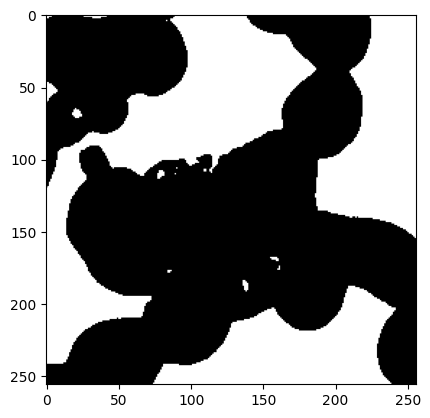

In [ ]:
from skimage.filters import threshold_otsu

# Threshold the original image to create a binary mask

threshold_value = threshold_otsu(img_to_seg)
binary_mask = (img_to_seg > threshold_value)*1

plt.imshow(binary_mask, cmap=plt.cm.gray)

To compare segmentation results, we can use metrics such as Dice similarity coefficient or Jaccard index to compare the result of the segmentation with the thresholded image.

In [ ]:
from skimage import measure

# Function to calculate Dice similarity coefficient
def dice_coefficient(seg_true, seg_pred):
    intersection = np.sum(seg_true * seg_pred)
    union = np.sum(seg_true) + np.sum(seg_pred)
    dice = (2.0 * intersection) / union
    return dice

# Function to calculate Jaccard index
def jaccard_index(seg_true, seg_pred):
    intersection = np.sum(seg_true * seg_pred)
    union = np.sum(seg_true) + np.sum(seg_pred) - intersection
    jaccard = intersection / union
    return jaccard

# Calculate and print Dice similarity coefficient and Jaccard index
dice_no_eq = dice_coefficient(binary_mask, 1- cv_no_eq[0])
jaccard_no_eq = jaccard_index(binary_mask, 1- cv_no_eq[0])

dice_with_eq = dice_coefficient(binary_mask,1- cv_with_eq[0])
jaccard_with_eq = jaccard_index(binary_mask,1 -cv_with_eq[0])

print(f"Dice Similarity Coefficient without Equalization: {dice_no_eq:.4f}")
print(f"Jaccard Index without Equalization: {jaccard_no_eq:.4f}")

print(f"Dice Similarity Coefficient with Equalization: {dice_with_eq:.4f}")
print(f"Jaccard Index with Equalization: {jaccard_with_eq:.4f}")


Dice Similarity Coefficient without Equalization: 0.9827
Jaccard Index without Equalization: 0.9660
Dice Similarity Coefficient with Equalization: 0.8995
Jaccard Index with Equalization: 0.8174


As we can see the Coefficient without Equalization give better result than with Equalization.

4)

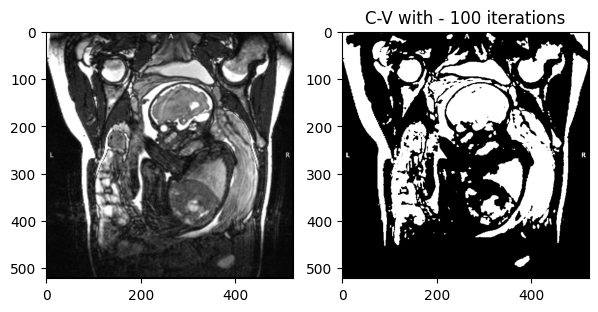

In [ ]:
img_to_seg= img_MRIf
mu_val=0.5 ; lambda1_val= 50; lambda2_val= 25; tol_val=1e-3; dt_val=0.5
smoothing_val = 1

Num_iter_cv_ori    = 100
Num_iter_cv_fast = 1

CHAN_VESE_ORI  = 1
Init_method    = "disk" # "checkerboard" or "disk" or "small disk" (alternative to use to set init_level_set)
#Init_method    = "checkerboard"

# run segmentation
if CHAN_VESE_ORI == 1:
    # STANDARD implementation from original paper

    cv = chan_vese(img_to_seg, mu=mu_val, lambda1=lambda1_val, lambda2=lambda2_val,
                   tol=tol_val, dt=dt_val,
                   max_num_iter=Num_iter_cv_ori, init_level_set=Init_method,
                   extended_output=True)
    fig, ax = plt.subplots(1,2,figsize=(7, 7))
    ax[0].imshow(img_to_seg, cmap=plt.cm.gray)
    ax[1].imshow(1-cv[0], cmap=plt.cm.gray)
    title = f'C-V with - {len(cv[2])} iterations'
    ax[1].set_title(title, fontsize=12)

else:
    # FASTER implementation implemented with morphological operators BUT LESS PRECISE
    cv      = morphological_chan_vese(img_to_seg, num_iter=Num_iter_cv_fast,
                                      smoothing=smoothing_val, init_level_set="checkerboard")
    fig, ax = plt.subplots(1,2,figsize=(7, 7))
    ax[0].imshow(img_to_seg, cmap=plt.cm.gray)
    ax[1].imshow(1-cv, cmap=plt.cm.gray)
    title = f'C-V_morph with - {Num_iter_cv_fast} iterations'
    ax[1].set_title(title, fontsize=12)


plt.show();

# Seg # 8

## Geometric active contours with balloon force

You are now also provided with a tool to track the deformation patterns of the active contour over iterations. <br>

The geometric active contour routine is **morphological_geodesic_active_contour** which deforms a level set function with local speed values. It has the following **hyper-parameters** :<br>
* Thresh_cont_val  = 'auto'=> np.percentile(image, 40) (default if 'auto')  | pixels < Thresh_cont_val are considered borders. The evolution of the contour will stop on these pixels. Threshold_mask_balloon = image > threshold / np.abs(Balloon_weight)
* Balloon_weight   = 1 (default) | weight of the balloon force. Can be negative to inflate/deflat
* Smooth_cont_iter = 1 (default) |  Number of times a smoothing operator is applied per iteration


# TO DO:
* Segment the img_cell with the provided configuration in line 1 to inflate the initial contour. What is the issue?
* Now Segment the img_cell with the provided configuration in line 2 to deflate the initial contour. Adjust balloon parameter accordingly. Fix the issues observed to get a perfect segmentation in 30 iterations.
* Segment the img_MRIb image with the configuration in line 3 set to inflate an initial contour. Comment issues seen with high and low smoothness regularisation over 300 iterations.
* Now propose and run a setup to attempt to segment the gray matter contours in img_MRIb or some structure in another image. Comment on your choice of parameters, number of iterations and observed quality of contours.



1)

0.7377611236173724


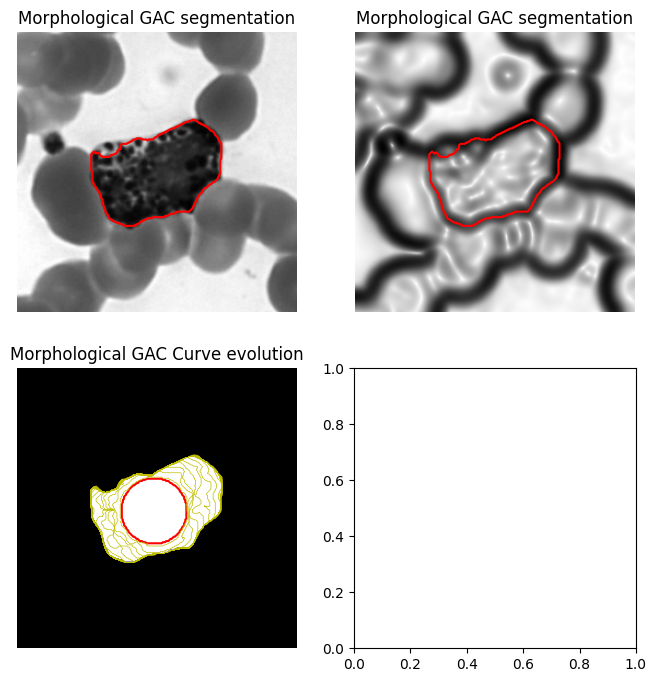

In [ ]:


img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 30  # inflate
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 70  # deflate
#img_to_seg = img_MRIb ; r0 = 500 ; c0 = 530 ; R0 = 30  # for spine and inflate



SMOOTHING    = 0; Niter_smooth = 3
INV_EDGE_MAP = 1; # needed when using the Balloon force

img_ori    = img_to_seg

# Hyper parameters for snake and balloon
Thresh_cont_val  = 'auto' ; Balloon_weight   = 1 ; Smooth_cont_iter = 1 ;
Niter_snake      = 100

# smoothing
if SMOOTHING:
    img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Test segment directly on edge image [QUESTION: WHY IS THE RESULT DIFFERENT?]
if INV_EDGE_MAP:
    img_to_seg = skimage.segmentation.inverse_gaussian_gradient(img_to_seg) # Compute the magnitude of the gradients in the image and then inverts the result in the range [0, 1]

#Print threshold used by "auto"
print(np.percentile(img_to_seg, 40))


# initialise call back
evolution = []
callback = store_evolution_in(evolution)

# Initialise contour
init_ls  = skimage.segmentation.disk_level_set(img_to_seg.shape, center=[r0,c0], radius=R0)

# Run geodesic active contour
ls       = morphological_geodesic_active_contour(
            img_to_seg, Niter_snake, init_ls,
            smoothing=Smooth_cont_iter, balloon=Balloon_weight,
            threshold=Thresh_cont_val,
            iter_callback=callback);


fig, axes = plt.subplots(2, 2, figsize=(8, 8));
ax = axes.flatten();

ax[0].imshow(img_ori, cmap="gray");
ax[0].set_axis_off();
ax[0].contour(ls, [0.5], colors='r');
ax[0].set_title("Morphological GAC segmentation", fontsize=12);

ax[1].imshow(img_to_seg, cmap="gray");
ax[1].set_axis_off();
ax[1].contour(ls, [0.5], colors='r');
ax[1].set_title("Morphological GAC segmentation", fontsize=12);

ax[2].imshow(ls, cmap="gray");
ax[2].set_axis_off();
contour = ax[2].contour(evolution[0], [0.5], colors='r');
contour.collections[0].set_label("Contours");
title = f'Morphological GAC Curve evolution';
ax[2].set_title(title, fontsize=12);
for i in range(1, Niter_snake-1, 5):
    contour = ax[2].contour(evolution[i], [0.01], linewidths=0.5, colors='y');

plt.show();

The problem could stem from parameter choices, specifically the balloon weight (Balloon_weight = 1) or smoothing. To address this, experiment with various values to achieve the desired inflation. It was observed that adjusting the Balloon_weight to 1.08 resolved the issue, providing the desired inflation. Additionally, setting the smoothing value to 1 also proved effective in rectifying the problem.

0.7377611236173724


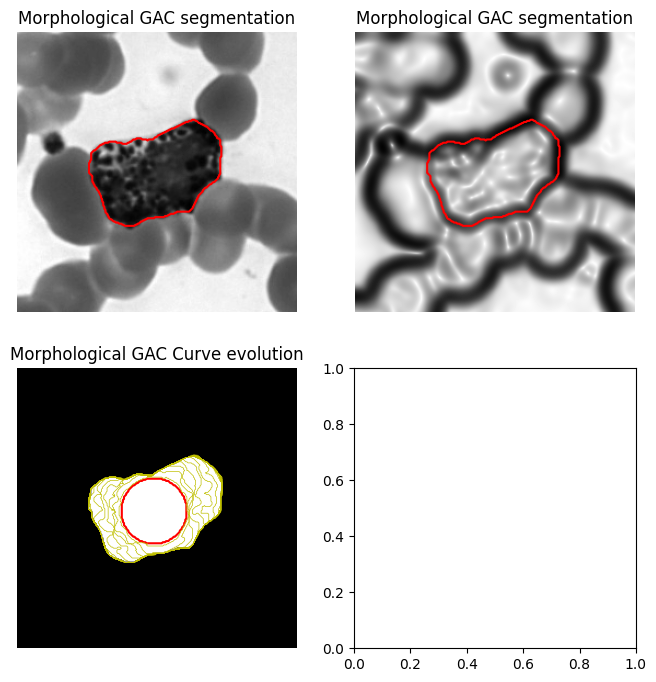

In [ ]:


img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 30  # inflate
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 70  # deflate
#img_to_seg = img_MRIb ; r0 = 500 ; c0 = 530 ; R0 = 30  # for spine and inflate



SMOOTHING    = 0; Niter_smooth = 3
INV_EDGE_MAP = 1; # needed when using the Balloon force

img_ori    = img_to_seg

# Hyper parameters for snake and balloon
Thresh_cont_val  = 'auto' ; Balloon_weight   = 1.08 ; Smooth_cont_iter = 1 ;
Niter_snake      = 100

# smoothing
if SMOOTHING:
    img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Test segment directly on edge image [QUESTION: WHY IS THE RESULT DIFFERENT?]
if INV_EDGE_MAP:
    img_to_seg = skimage.segmentation.inverse_gaussian_gradient(img_to_seg) # Compute the magnitude of the gradients in the image and then inverts the result in the range [0, 1]

#Print threshold used by "auto"
print(np.percentile(img_to_seg, 40))


# initialise call back
evolution = []
callback = store_evolution_in(evolution)

# Initialise contour
init_ls  = skimage.segmentation.disk_level_set(img_to_seg.shape, center=[r0,c0], radius=R0)

# Run geodesic active contour
ls       = morphological_geodesic_active_contour(
            img_to_seg, Niter_snake, init_ls,
            smoothing=Smooth_cont_iter, balloon=Balloon_weight,
            threshold=Thresh_cont_val,
            iter_callback=callback);


fig, axes = plt.subplots(2, 2, figsize=(8, 8));
ax = axes.flatten();

ax[0].imshow(img_ori, cmap="gray");
ax[0].set_axis_off();
ax[0].contour(ls, [0.5], colors='r');
ax[0].set_title("Morphological GAC segmentation", fontsize=12);

ax[1].imshow(img_to_seg, cmap="gray");
ax[1].set_axis_off();
ax[1].contour(ls, [0.5], colors='r');
ax[1].set_title("Morphological GAC segmentation", fontsize=12);

ax[2].imshow(ls, cmap="gray");
ax[2].set_axis_off();
contour = ax[2].contour(evolution[0], [0.5], colors='r');
contour.collections[0].set_label("Contours");
title = f'Morphological GAC Curve evolution';
ax[2].set_title(title, fontsize=12);
for i in range(1, Niter_snake-1, 5):
    contour = ax[2].contour(evolution[i], [0.01], linewidths=0.5, colors='y');

plt.show();

0.7331013863029695


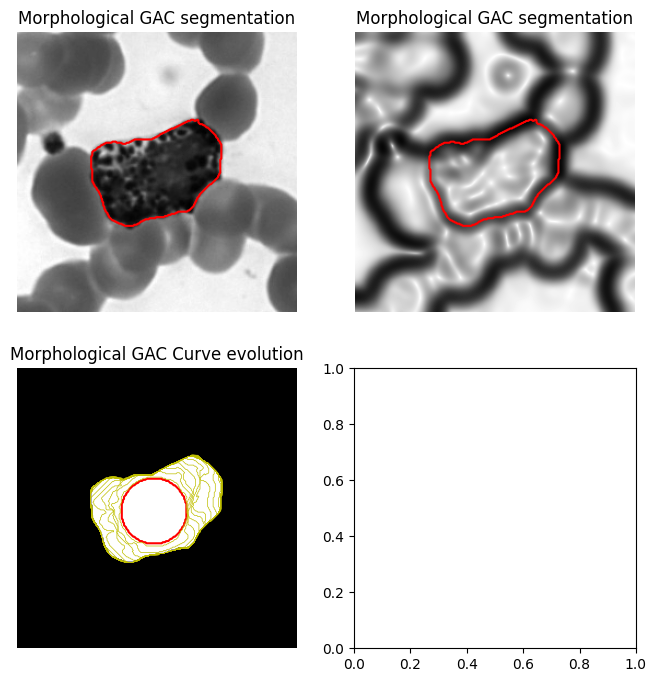

In [ ]:


img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 30  # inflate
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 70  # deflate
#img_to_seg = img_MRIb ; r0 = 500 ; c0 = 530 ; R0 = 30  # for spine and inflate



SMOOTHING    = 1; Niter_smooth = 3
INV_EDGE_MAP = 1; # needed when using the Balloon force

img_ori    = img_to_seg

# Hyper parameters for snake and balloon
Thresh_cont_val  = 'auto' ; Balloon_weight   = 1 ; Smooth_cont_iter = 1 ;
Niter_snake      = 100

# smoothing
if SMOOTHING:
    img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Test segment directly on edge image [QUESTION: WHY IS THE RESULT DIFFERENT?]
if INV_EDGE_MAP:
    img_to_seg = skimage.segmentation.inverse_gaussian_gradient(img_to_seg) # Compute the magnitude of the gradients in the image and then inverts the result in the range [0, 1]

#Print threshold used by "auto"
print(np.percentile(img_to_seg, 40))


# initialise call back
evolution = []
callback = store_evolution_in(evolution)

# Initialise contour
init_ls  = skimage.segmentation.disk_level_set(img_to_seg.shape, center=[r0,c0], radius=R0)

# Run geodesic active contour
ls       = morphological_geodesic_active_contour(
            img_to_seg, Niter_snake, init_ls,
            smoothing=Smooth_cont_iter, balloon=Balloon_weight,
            threshold=Thresh_cont_val,
            iter_callback=callback);


fig, axes = plt.subplots(2, 2, figsize=(8, 8));
ax = axes.flatten();

ax[0].imshow(img_ori, cmap="gray");
ax[0].set_axis_off();
ax[0].contour(ls, [0.5], colors='r');
ax[0].set_title("Morphological GAC segmentation", fontsize=12);

ax[1].imshow(img_to_seg, cmap="gray");
ax[1].set_axis_off();
ax[1].contour(ls, [0.5], colors='r');
ax[1].set_title("Morphological GAC segmentation", fontsize=12);

ax[2].imshow(ls, cmap="gray");
ax[2].set_axis_off();
contour = ax[2].contour(evolution[0], [0.5], colors='r');
contour.collections[0].set_label("Contours");
title = f'Morphological GAC Curve evolution';
ax[2].set_title(title, fontsize=12);
for i in range(1, Niter_snake-1, 5):
    contour = ax[2].contour(evolution[i], [0.01], linewidths=0.5, colors='y');

plt.show();

2)

0.7377611236173724


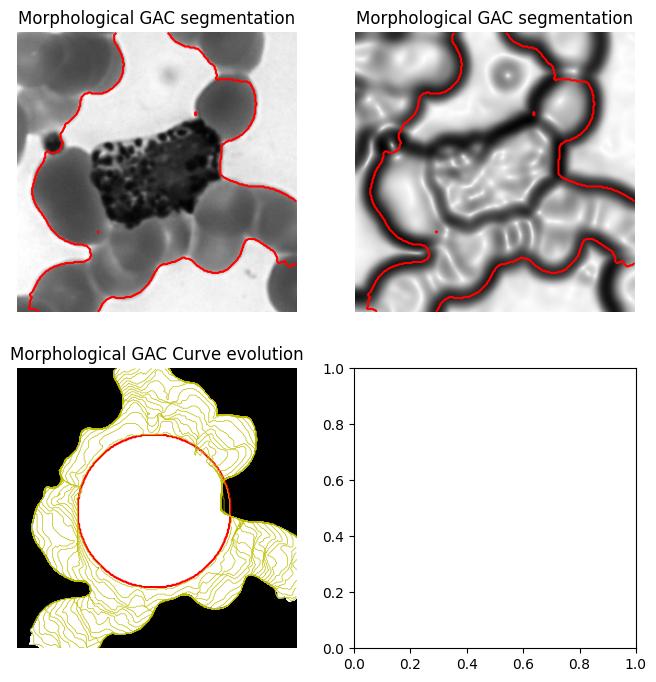

In [ ]:


#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 30  # inflate
img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 70  # deflate
#img_to_seg = img_MRIb ; r0 = 500 ; c0 = 530 ; R0 = 30  # for spine and inflate



SMOOTHING    = 0; Niter_smooth = 3
INV_EDGE_MAP = 1; # needed when using the Balloon force

img_ori    = img_to_seg

# Hyper parameters for snake and balloon
Thresh_cont_val  = 'auto' ; Balloon_weight   = 1 ; Smooth_cont_iter = 1 ;
Niter_snake      = 100

# smoothing
if SMOOTHING:
    img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Test segment directly on edge image [QUESTION: WHY IS THE RESULT DIFFERENT?]
if INV_EDGE_MAP:
    img_to_seg = skimage.segmentation.inverse_gaussian_gradient(img_to_seg) # Compute the magnitude of the gradients in the image and then inverts the result in the range [0, 1]

#Print threshold used by "auto"
print(np.percentile(img_to_seg, 40))


# initialise call back
evolution = []
callback = store_evolution_in(evolution)

# Initialise contour
init_ls  = skimage.segmentation.disk_level_set(img_to_seg.shape, center=[r0,c0], radius=R0)

# Run geodesic active contour
ls       = morphological_geodesic_active_contour(
            img_to_seg, Niter_snake, init_ls,
            smoothing=Smooth_cont_iter, balloon=Balloon_weight,
            threshold=Thresh_cont_val,
            iter_callback=callback);


fig, axes = plt.subplots(2, 2, figsize=(8, 8));
ax = axes.flatten();

ax[0].imshow(img_ori, cmap="gray");
ax[0].set_axis_off();
ax[0].contour(ls, [0.5], colors='r');
ax[0].set_title("Morphological GAC segmentation", fontsize=12);

ax[1].imshow(img_to_seg, cmap="gray");
ax[1].set_axis_off();
ax[1].contour(ls, [0.5], colors='r');
ax[1].set_title("Morphological GAC segmentation", fontsize=12);

ax[2].imshow(ls, cmap="gray");
ax[2].set_axis_off();
contour = ax[2].contour(evolution[0], [0.5], colors='r');
contour.collections[0].set_label("Contours");
title = f'Morphological GAC Curve evolution';
ax[2].set_title(title, fontsize=12);
for i in range(1, Niter_snake-1, 5):
    contour = ax[2].contour(evolution[i], [0.01], linewidths=0.5, colors='y');

plt.show();

0.7377611236173724


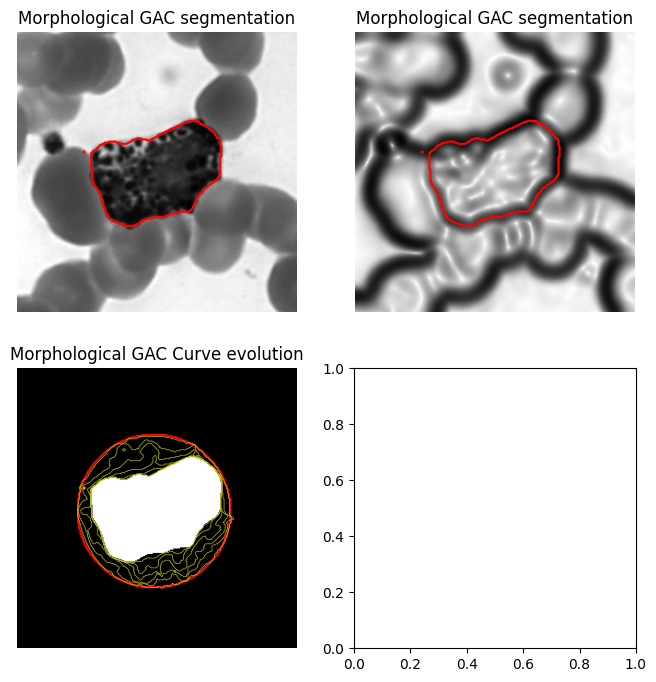

In [ ]:
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 30  # inflate
img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 70  # deflate
#img_to_seg = img_MRIb ; r0 = 500 ; c0 = 530 ; R0 = 30  # for spine and inflate



SMOOTHING    = 0; Niter_smooth = 3
INV_EDGE_MAP = 1; # needed when using the Balloon force

img_ori    = img_to_seg

# Hyper parameters for snake and balloon
Thresh_cont_val  = 'auto' ; Balloon_weight   = -1.05 ; Smooth_cont_iter = 1 ;
Niter_snake      = 30

# smoothing
if SMOOTHING:
    img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Test segment directly on edge image [QUESTION: WHY IS THE RESULT DIFFERENT?]
if INV_EDGE_MAP:
    img_to_seg = skimage.segmentation.inverse_gaussian_gradient(img_to_seg) # Compute the magnitude of the gradients in the image and then inverts the result in the range [0, 1]

#Print threshold used by "auto"
print(np.percentile(img_to_seg, 40))


# initialise call back
evolution = []
callback = store_evolution_in(evolution)

# Initialise contour
init_ls  = skimage.segmentation.disk_level_set(img_to_seg.shape, center=[r0,c0], radius=R0)

# Run geodesic active contour
ls       = morphological_geodesic_active_contour(
            img_to_seg, Niter_snake, init_ls,
            smoothing=Smooth_cont_iter, balloon=Balloon_weight,
            threshold=Thresh_cont_val,
            iter_callback=callback);


fig, axes = plt.subplots(2, 2, figsize=(8, 8));
ax = axes.flatten();

ax[0].imshow(img_ori, cmap="gray");
ax[0].set_axis_off();
ax[0].contour(ls, [0.5], colors='r');
ax[0].set_title("Morphological GAC segmentation", fontsize=12);

ax[1].imshow(img_to_seg, cmap="gray");
ax[1].set_axis_off();
ax[1].contour(ls, [0.5], colors='r');
ax[1].set_title("Morphological GAC segmentation", fontsize=12);

ax[2].imshow(ls, cmap="gray");
ax[2].set_axis_off();
contour = ax[2].contour(evolution[0], [0.5], colors='r');
contour.collections[0].set_label("Contours");
title = f'Morphological GAC Curve evolution';
ax[2].set_title(title, fontsize=12);
for i in range(1, Niter_snake-1, 5):
    contour = ax[2].contour(evolution[i], [0.01], linewidths=0.5, colors='y');

plt.show();

3)

0.785146875520775


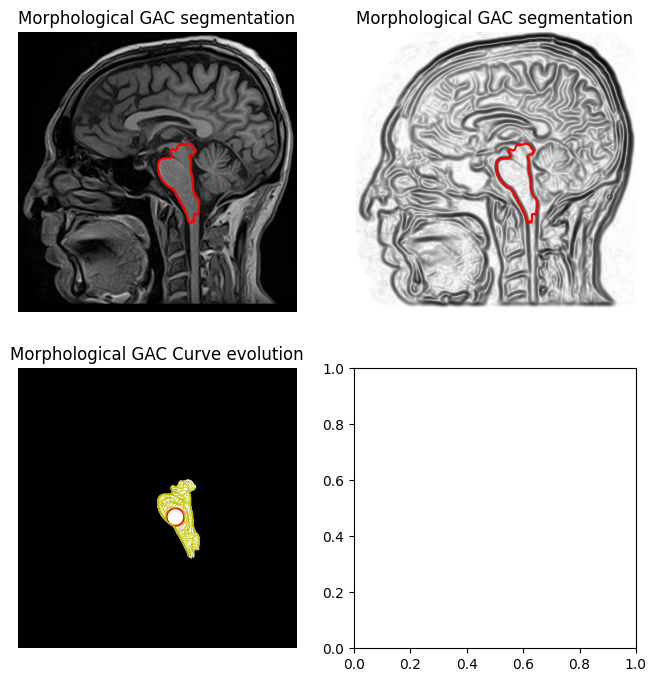

In [ ]:
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 30  # inflate
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 70  # deflate
img_to_seg = img_MRIb ; r0 = 500 ; c0 = 530 ; R0 = 30  # for spine and inflate



SMOOTHING    = 0; Niter_smooth = 3
INV_EDGE_MAP = 1; # needed when using the Balloon force

img_ori    = img_to_seg

# Hyper parameters for snake and balloon
Thresh_cont_val  = 'auto' ; Balloon_weight   = 1 ; Smooth_cont_iter = 1 ;
Niter_snake      = 100

# smoothing
if SMOOTHING:
    img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Test segment directly on edge image [QUESTION: WHY IS THE RESULT DIFFERENT?]
if INV_EDGE_MAP:
    img_to_seg = skimage.segmentation.inverse_gaussian_gradient(img_to_seg) # Compute the magnitude of the gradients in the image and then inverts the result in the range [0, 1]

#Print threshold used by "auto"
print(np.percentile(img_to_seg, 40))


# initialise call back
evolution = []
callback = store_evolution_in(evolution)

# Initialise contour
init_ls  = skimage.segmentation.disk_level_set(img_to_seg.shape, center=[r0,c0], radius=R0)

# Run geodesic active contour
ls       = morphological_geodesic_active_contour(
            img_to_seg, Niter_snake, init_ls,
            smoothing=Smooth_cont_iter, balloon=Balloon_weight,
            threshold=Thresh_cont_val,
            iter_callback=callback);


fig, axes = plt.subplots(2, 2, figsize=(8, 8));
ax = axes.flatten();

ax[0].imshow(img_ori, cmap="gray");
ax[0].set_axis_off();
ax[0].contour(ls, [0.5], colors='r');
ax[0].set_title("Morphological GAC segmentation", fontsize=12);

ax[1].imshow(img_to_seg, cmap="gray");
ax[1].set_axis_off();
ax[1].contour(ls, [0.5], colors='r');
ax[1].set_title("Morphological GAC segmentation", fontsize=12);

ax[2].imshow(ls, cmap="gray");
ax[2].set_axis_off();
contour = ax[2].contour(evolution[0], [0.5], colors='r');
contour.collections[0].set_label("Contours");
title = f'Morphological GAC Curve evolution';
ax[2].set_title(title, fontsize=12);
for i in range(1, Niter_snake-1, 5):
    contour = ax[2].contour(evolution[i], [0.01], linewidths=0.5, colors='y');

plt.show();

0.785146875520775


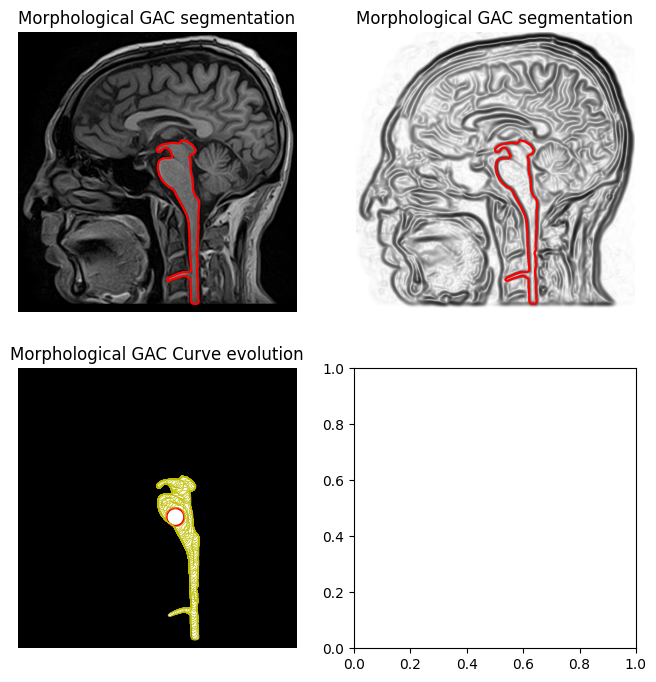

In [ ]:
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 30  # inflate
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 70  # deflate
img_to_seg = img_MRIb ; r0 = 500 ; c0 = 530 ; R0 = 30  # for spine and inflate



SMOOTHING    = 0; Niter_smooth = 3
INV_EDGE_MAP = 1; # needed when using the Balloon force

img_ori    = img_to_seg

# Hyper parameters for snake and balloon
Thresh_cont_val  = 'auto' ; Balloon_weight   = 1 ; Smooth_cont_iter = 1 ;
Niter_snake      = 300

# smoothing
if SMOOTHING:
    img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Test segment directly on edge image [QUESTION: WHY IS THE RESULT DIFFERENT?]
if INV_EDGE_MAP:
    img_to_seg = skimage.segmentation.inverse_gaussian_gradient(img_to_seg) # Compute the magnitude of the gradients in the image and then inverts the result in the range [0, 1]

#Print threshold used by "auto"
print(np.percentile(img_to_seg, 40))


# initialise call back
evolution = []
callback = store_evolution_in(evolution)

# Initialise contour
init_ls  = skimage.segmentation.disk_level_set(img_to_seg.shape, center=[r0,c0], radius=R0)

# Run geodesic active contour
ls       = morphological_geodesic_active_contour(
            img_to_seg, Niter_snake, init_ls,
            smoothing=Smooth_cont_iter, balloon=Balloon_weight,
            threshold=Thresh_cont_val,
            iter_callback=callback);


fig, axes = plt.subplots(2, 2, figsize=(8, 8));
ax = axes.flatten();

ax[0].imshow(img_ori, cmap="gray");
ax[0].set_axis_off();
ax[0].contour(ls, [0.5], colors='r');
ax[0].set_title("Morphological GAC segmentation", fontsize=12);

ax[1].imshow(img_to_seg, cmap="gray");
ax[1].set_axis_off();
ax[1].contour(ls, [0.5], colors='r');
ax[1].set_title("Morphological GAC segmentation", fontsize=12);

ax[2].imshow(ls, cmap="gray");
ax[2].set_axis_off();
contour = ax[2].contour(evolution[0], [0.5], colors='r');
contour.collections[0].set_label("Contours");
title = f'Morphological GAC Curve evolution';
ax[2].set_title(title, fontsize=12);
for i in range(1, Niter_snake-1, 5):
    contour = ax[2].contour(evolution[i], [0.01], linewidths=0.5, colors='y');

plt.show();

0.785146875520775


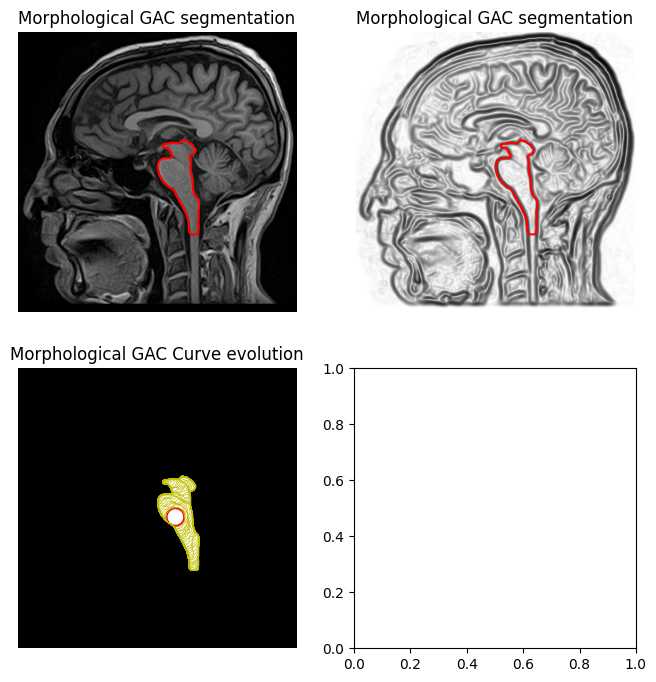

In [ ]:
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 30  # inflate
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 70  # deflate
img_to_seg = img_MRIb ; r0 = 500 ; c0 = 530 ; R0 = 30  # for spine and inflate



SMOOTHING    = 0; Niter_smooth = 3
INV_EDGE_MAP = 1; # needed when using the Balloon force

img_ori    = img_to_seg

# Hyper parameters for snake and balloon
Thresh_cont_val  = 'auto' ; Balloon_weight   = 1 ; Smooth_cont_iter = 10 ;
Niter_snake      = 300

# smoothing
if SMOOTHING:
    img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Test segment directly on edge image [QUESTION: WHY IS THE RESULT DIFFERENT?]
if INV_EDGE_MAP:
    img_to_seg = skimage.segmentation.inverse_gaussian_gradient(img_to_seg) # Compute the magnitude of the gradients in the image and then inverts the result in the range [0, 1]

#Print threshold used by "auto"
print(np.percentile(img_to_seg, 40))


# initialise call back
evolution = []
callback = store_evolution_in(evolution)

# Initialise contour
init_ls  = skimage.segmentation.disk_level_set(img_to_seg.shape, center=[r0,c0], radius=R0)

# Run geodesic active contour
ls       = morphological_geodesic_active_contour(
            img_to_seg, Niter_snake, init_ls,
            smoothing=Smooth_cont_iter, balloon=Balloon_weight,
            threshold=Thresh_cont_val,
            iter_callback=callback);


fig, axes = plt.subplots(2, 2, figsize=(8, 8));
ax = axes.flatten();

ax[0].imshow(img_ori, cmap="gray");
ax[0].set_axis_off();
ax[0].contour(ls, [0.5], colors='r');
ax[0].set_title("Morphological GAC segmentation", fontsize=12);

ax[1].imshow(img_to_seg, cmap="gray");
ax[1].set_axis_off();
ax[1].contour(ls, [0.5], colors='r');
ax[1].set_title("Morphological GAC segmentation", fontsize=12);

ax[2].imshow(ls, cmap="gray");
ax[2].set_axis_off();
contour = ax[2].contour(evolution[0], [0.5], colors='r');
contour.collections[0].set_label("Contours");
title = f'Morphological GAC Curve evolution';
ax[2].set_title(title, fontsize=12);
for i in range(1, Niter_snake-1, 5):
    contour = ax[2].contour(evolution[i], [0.01], linewidths=0.5, colors='y');

plt.show();


During the inflation of the initial contour on img_MRIb, different levels of smoothness regularization were tested over 300 iterations. Higher smoothness led to a overly smooth contour, diminishing sensitivity to fine details and accuracy. Conversely, lower smoothness increased sensitivity but introduced noise sensitivity and erratic behavior. Striking a balance through iterative adjustments is crucial for optimal segmentation, ensuring both smooth convergence and preservation of essential details

4)

0.785146875520775


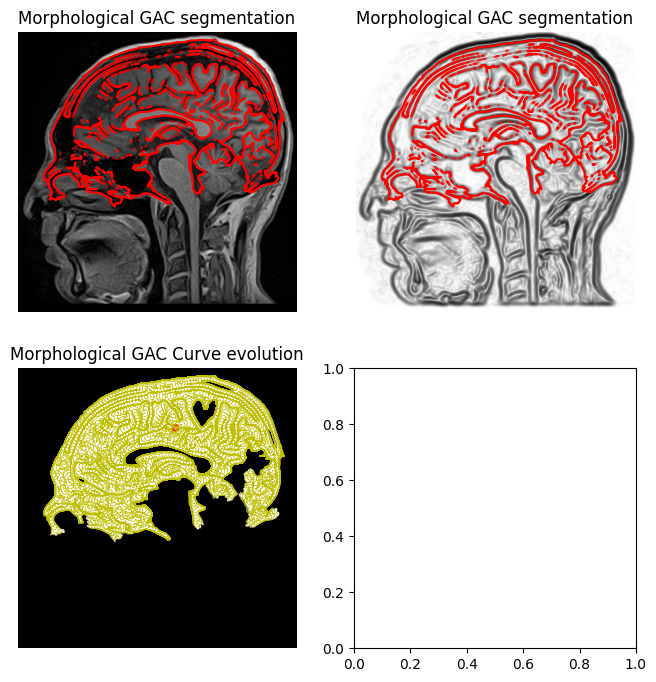

In [ ]:
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 30  # inflate
#img_to_seg = img_cell ; r0 = 130;  c0 = 125 ; R0 = 70  # deflate
img_to_seg = img_MRIb ; r0 = 200 ; c0 = 530 ; R0 = 10  # for spine and inflate



SMOOTHING    = 0; Niter_smooth = 3
INV_EDGE_MAP = 1; # needed when using the Balloon force

img_ori    = img_to_seg

# Hyper parameters for snake and balloon
Thresh_cont_val  = 'auto' ; Balloon_weight   = 1 ; Smooth_cont_iter = 0 ;
Niter_snake      = 450

# smoothing
if SMOOTHING:
    img_to_seg = gaussian(img_to_seg, Niter_smooth, preserve_range=False)

# Test segment directly on edge image [QUESTION: WHY IS THE RESULT DIFFERENT?]
if INV_EDGE_MAP:
    img_to_seg = skimage.segmentation.inverse_gaussian_gradient(img_to_seg) # Compute the magnitude of the gradients in the image and then inverts the result in the range [0, 1]

#Print threshold used by "auto"
print(np.percentile(img_to_seg, 40))


# initialise call back
evolution = []
callback = store_evolution_in(evolution)

# Initialise contour
init_ls  = skimage.segmentation.disk_level_set(img_to_seg.shape, center=[r0,c0], radius=R0)

# Run geodesic active contour
ls       = morphological_geodesic_active_contour(
            img_to_seg, Niter_snake, init_ls,
            smoothing=Smooth_cont_iter, balloon=Balloon_weight,
            threshold=Thresh_cont_val,
            iter_callback=callback);


fig, axes = plt.subplots(2, 2, figsize=(8, 8));
ax = axes.flatten();

ax[0].imshow(img_ori, cmap="gray");
ax[0].set_axis_off();
ax[0].contour(ls, [0.5], colors='r');
ax[0].set_title("Morphological GAC segmentation", fontsize=12);

ax[1].imshow(img_to_seg, cmap="gray");
ax[1].set_axis_off();
ax[1].contour(ls, [0.5], colors='r');
ax[1].set_title("Morphological GAC segmentation", fontsize=12);

ax[2].imshow(ls, cmap="gray");
ax[2].set_axis_off();
contour = ax[2].contour(evolution[0], [0.5], colors='r');
contour.collections[0].set_label("Contours");
title = f'Morphological GAC Curve evolution';
ax[2].set_title(title, fontsize=12);
for i in range(1, Niter_snake-1, 5):
    contour = ax[2].contour(evolution[i], [0.01], linewidths=0.5, colors='y');

plt.show();

- Smooth_cont_iter = 0 : detect fine details
- r0 = 200 ; c0 = 530 ; R0 = 10 : to position a small circle in the gray matter
- Number of Iterations: Increased the number of iterations (Niter_snake = 450) for more refined contour evolution.